########################################################################################
## READING THE DATA COMING FROM GECO2020 INTERFACE 
########################################################################################
## IN THE FOLLOWING THE DATA FILE CONTAINS ONLY INFORMATION ON:
## TIMESTAMP
## BOARD NUMBER
## CHANNEL NUMBER
## MONITORED VOLTAGE VALUE 
## MONITORED CURRENT VALUE
########################################################################################

In [533]:
########################################################################################
## SETTING UP
########################################################################################
import numpy as np
import pandas as pd
import itertools
from matplotlib import markers
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches

large = 22; med = 16; small = 12
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'figure.figsize': (16, 10),
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large}
plt.rcParams.update(params)
plt.style.use('seaborn-whitegrid')


color={0:'blue',1:'red', 2:'blue', 3:'green', 4:'yellow', 5:'lime', 6:'pink',
    7:'cyan', 8:'magenta', 9:'orange', 10:'tomato', 11:'purple', 12:'brown',
    13:'aquamarine', 14:'navy', 15:'beige', 16:'coral', 17:'darkblue', 18:'gold',
    19:'darkgreen', 20:'crimson', 21:'violet', 22:'turquoise', 23:'indigo'}
pop_a = mpatches.Patch(color='blue', label='CH-0')
pop_b = mpatches.Patch(color='red', label='CH-1')
pop_c = mpatches.Patch(color='blue', label='CH-2')
pop_d = mpatches.Patch(color='green', label='CH-3')
pop_e = mpatches.Patch(color='yellow', label='CH-4')
pop_f = mpatches.Patch(color='lime', label='CH-5')
pop_g = mpatches.Patch(color='pink', label='CH-6')
pop_h = mpatches.Patch(color='cyan', label='CH-7')
pop_j = mpatches.Patch(color='magenta', label='CH-8')
pop_k = mpatches.Patch(color='orange', label='CH-9')
pop_l = mpatches.Patch(color='tomato', label='CH-10')
pop_m = mpatches.Patch(color='purple', label='CH-11')
pop_n = mpatches.Patch(color='brown', label='CH-12')
pop_o = mpatches.Patch(color='aquamarine', label='CH-13')
pop_p = mpatches.Patch(color='navy', label='CH-14')
pop_r = mpatches.Patch(color='beige', label='CH-15')
pop_q = mpatches.Patch(color='coral', label='CH-16')
pop_s = mpatches.Patch(color='darkblue', label='CH-17')
pop_t = mpatches.Patch(color='gold', label='CH-18')
pop_u = mpatches.Patch(color='darkgreen', label='CH-19')
pop_v = mpatches.Patch(color='crimson', label='CH-20')
pop_w = mpatches.Patch(color='violet', label='CH-21')
pop_x = mpatches.Patch(color='turquoise', label='CH-22')
pop_y = mpatches.Patch(color='indigo', label='CH-23')

channels=[pop_a,pop_b,pop_c,pop_d,pop_e,pop_f,pop_g,pop_h,pop_j,pop_k,
         pop_l,pop_m,pop_n,pop_o,pop_p,pop_r,pop_q,pop_s,pop_t,pop_u,
         pop_v,pop_w,pop_x,pop_y]

plt.rcParams['legend.title_fontsize'] = 'x-large'

In [534]:
########################################################################################
## READING THE DATA FROM A FILE INTO PANDA DATAFRAME
########################################################################################
df = pd.read_csv("Stability_8-04_22_25C.log", 
                 delim_whitespace=True, 
                 names=["TimeStamp","Th","Bd","Board","Ch","Channel","par","Monitoring","val","Value"])
#df.info()
#df.describe()
#df.head()
#df.columns
###################################################
## SOME CLEANING IN THE DATA 
## REMOVE SPECIAL CHARACTERS
###################################################
df = df.replace({'\[','\]:',']',';'},'',regex=True)
print(df)

                 TimeStamp       Th  Bd Board  Ch Channel  par Monitoring  \
0      2022-04-08T10:28:02  thermal  bd     4  ch       0  par       VMon   
1      2022-04-08T10:28:02  thermal  bd     4  ch       0  par       IMon   
2      2022-04-08T10:28:02  thermal  bd     4  ch       1  par       VMon   
3      2022-04-08T10:28:02  thermal  bd     4  ch       1  par       IMon   
4      2022-04-08T10:28:02  thermal  bd     4  ch       6  par       VMon   
...                    ...      ...  ..   ...  ..     ...  ...        ...   
57145  2022-04-08T12:18:33  thermal  bd     4  ch       5  par       IMon   
57146  2022-04-08T12:18:33  thermal  bd     4  ch      19  par       VMon   
57147  2022-04-08T12:18:33  thermal  bd     4  ch      19  par       IMon   
57148  2022-04-08T12:18:33  thermal  bd     4  ch      20  par       VMon   
57149  2022-04-08T12:18:33  thermal  bd     4  ch      20  par       IMon   

       val    Value  
0      val  2501.73  
1      val  441.923  
2      va

In [535]:
#######################################################################################
## TIMESTAMP INTO DATA, TIME, HOUR
#######################################################################################
pd.Timestamp(current['TimeStamp'][1])
df['StartTime'] = df["TimeStamp"].apply(lambda x: pd.Timestamp(x))
## the following if it is needed 
#df['Date'] = df["StartTime"].apply(lambda x: x.date())
#df['Time'] = df["StartTime"].apply(lambda x: x.time())
#df['Hour'] = df["StartTime"].apply(lambda x: x.hour)
df.dtypes

TimeStamp             object
Th                    object
Bd                    object
Board                 object
Ch                    object
Channel               object
par                   object
Monitoring            object
val                   object
Value                 object
StartTime     datetime64[ns]
Date                  object
Time                  object
Hour                   int64
dtype: object

In [536]:
#######################################################################################
## CONVERT BOARD, CHANNEL AND VALUE COLUMNS FROM OBJECT TO NUMERIC 
#######################################################################################
df['Channel']=df['Channel'].astype(int)
df['Board']=df['Board'].astype(int)
df['Value']=df['Value'].astype(float)
df.dtypes

TimeStamp             object
Th                    object
Bd                    object
Board                  int64
Ch                    object
Channel                int64
par                   object
Monitoring            object
val                   object
Value                float64
StartTime     datetime64[ns]
Date                  object
Time                  object
Hour                   int64
dtype: object

In [574]:
#######################################################################################
## ACCUMULATE MONITORED CURRENT AND VOLTAGE VALUES IN SEPARATE DATAFRAMES  
#######################################################################################
current = df.loc[(df['Monitoring']=="IMon")]
#current.reset_index()
current = current.set_index('StartTime')
## remove unneccessary columns: Th, Bd, Ch, par, Monitoring and val
current.drop(['Th','Bd','Ch','par','Monitoring','val'], axis=1, inplace=True)
###################################################
voltage = df.loc[(df['Monitoring']=="VMon")]
#voltage.reset_index()
voltage = voltage.set_index('StartTime')
## remove unneccessary columns: Th, Bd, Ch, par, Monitoring and val
voltage.drop(['Th','Bd','Ch','par','Monitoring','val'], axis=1, inplace=True)
#print(voltage)

In [575]:
print(len(current.index))
print(len(voltage.index))
df.head()

28575
28575


,TimeStamp,Th,Bd,Board,Ch,Channel,par,Monitoring,val,Value,StartTime,Date,Time,Hour
0,2022-04-08T10:28:02,thermal,bd,4,ch,0,par,VMon,val,2501.730,2022-04-08 10:28:02,2022-04-08,10:28:02,10
1,2022-04-08T10:28:02,thermal,bd,4,ch,0,par,IMon,val,441.923,2022-04-08 10:28:02,2022-04-08,10:28:02,10
2,2022-04-08T10:28:02,thermal,bd,4,ch,1,par,VMon,val,2500.630,2022-04-08 10:28:02,2022-04-08,10:28:02,10
3,2022-04-08T10:28:02,thermal,bd,4,ch,1,par,IMon,val,442.323,2022-04-08 10:28:02,2022-04-08,10:28:02,10
4,2022-04-08T10:28:02,thermal,bd,4,ch,6,par,VMon,val,2502.640,2022-04-08 10:28:02,2022-04-08,10:28:02,10


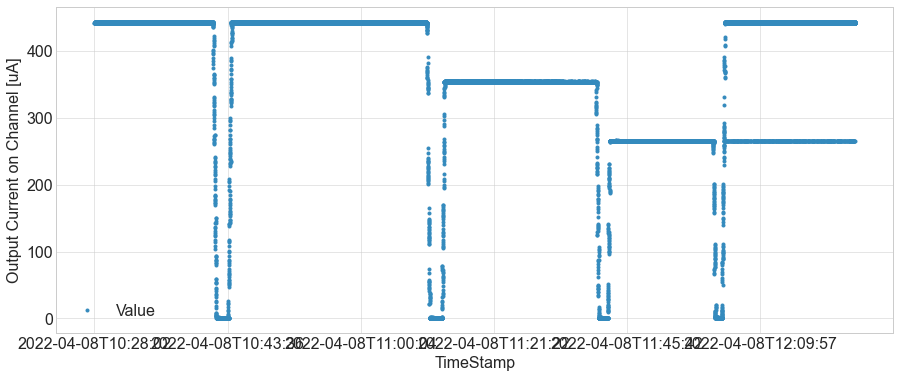

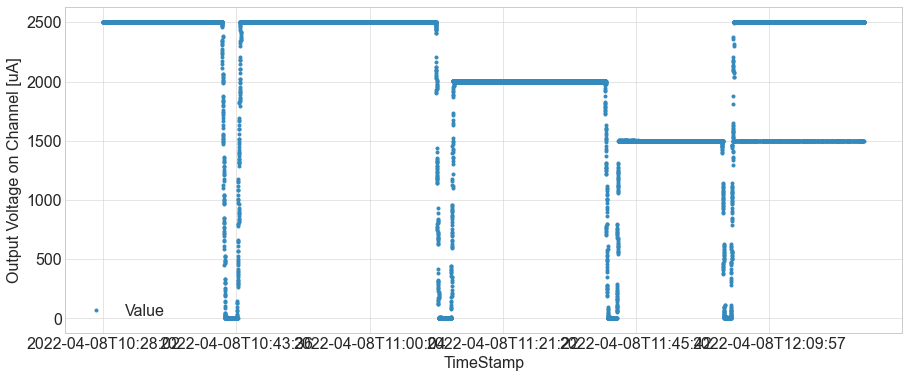

In [576]:
#######################################################################################
## QUICK CHECK FOR MONITORED CURRENT AND VOLTAGE VALUES  
#######################################################################################
ax = current.plot(x="TimeStamp",y="Value",style='.',figsize=(15,6))
ax.set(xlabel='TimeStamp', ylabel='Output Current on Channel [uA]')
plt.show()

ax= voltage.plot(x="TimeStamp",y="Value",style='.',figsize=(15,6))
ax.set(xlabel='TimeStamp', ylabel='Output Voltage on Channel [uA]')
plt.show()

#######################################################################################
## CHECK RUN BY RUN MONITORED CURRENT ON EACH CHANNEL 
#######################################################################################
## WE HAD 5 RUNS:
## 1ST RUN BY SETTING VOUT = 2500 V
## 2ND RUN BY SETTING VOUT = 2500 V
## 3RD RUN BY SETTING VOUT = 2000 V
## 4TH RUN BY SETTING VOUT = 1500 V
## 5TH RUN BY SETTING VOUT = 20 CHANNELS AT 2500 V AND 4 CHANNELS AT 1500 V
#######################################################################################

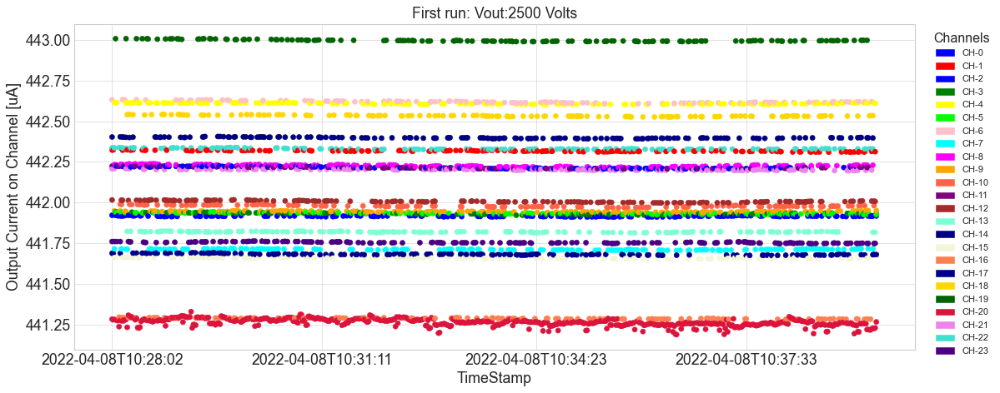

In [747]:
#######################################################################################
## FIRST RUN:
## 2022-04-08T10:28:02 to 2022-04-08T10:39:30
#######################################################################################
first_run = ["2022-04-08T10:28:02","2022-04-08T10:39:30"]
current_1st_run = current.loc[(current['TimeStamp']>=first_run[0])&(current['TimeStamp']<=first_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(current_1st_run['TimeStamp'],current_1st_run['Value'],c=current_1st_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Current on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
ax.grid(True)
plt.title('First run: Vout:2500 Volts')
plt.tight_layout()
plt.show()

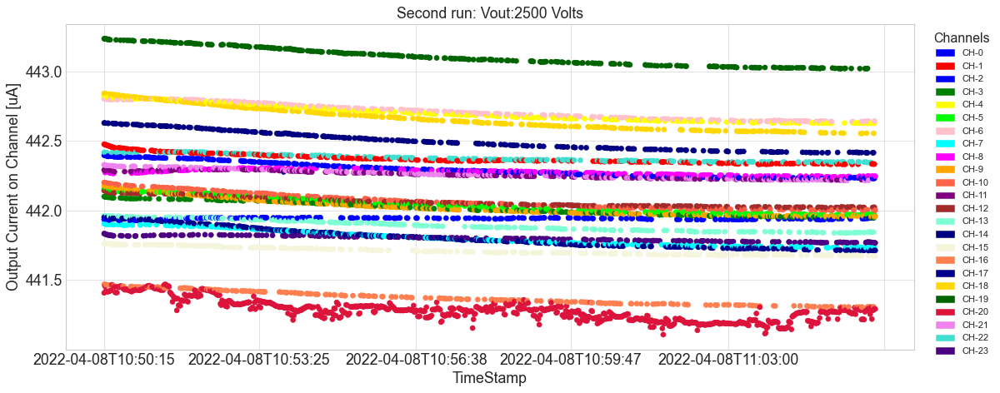

In [748]:
#######################################################################################
## SECOND:
## 2022-04-08T10:50:15 to 2022-04-08T11:06:00
#######################################################################################
second_run = ["2022-04-08T10:50:15","2022-04-08T11:06:00"]
current_2nd_run = current.loc[(current['TimeStamp']>=second_run[0])&(current['TimeStamp']<=second_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(current_2nd_run['TimeStamp'],current_2nd_run['Value'],c=current_2nd_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Current on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Second run: Vout:2500 Volts')
plt.tight_layout()
plt.show()

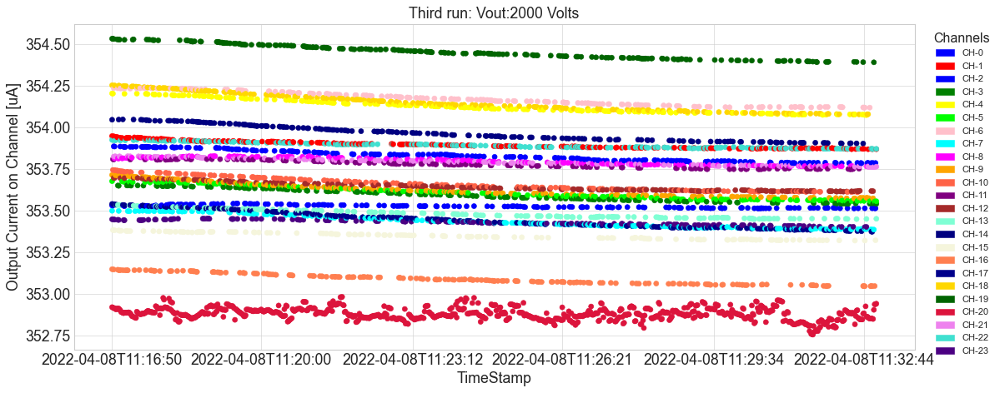

In [749]:
#######################################################################################
## THIRD RUN:
## 2022-04-08T11:16:50 to 2022-04-08T11:33:00
#######################################################################################
third_run = ["2022-04-08T11:16:50","2022-04-08T11:33:00"]
current_3rd_run = current.loc[(current['TimeStamp']>=third_run[0])&(current['TimeStamp']<=third_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(current_3rd_run['TimeStamp'],current_3rd_run['Value'],c=current_3rd_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Current on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Third run: Vout:2000 Volts')
plt.tight_layout()
plt.show()

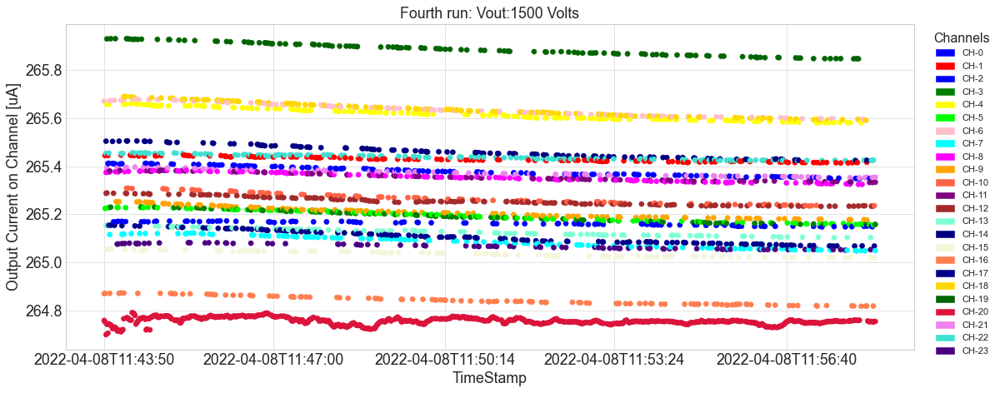

In [750]:
#######################################################################################
## FOURTH RUN:
## 2022-04-08T11:43:50 to 2022-04-08T11:58:20
#######################################################################################
fourth_run = ["2022-04-08T11:43:50","2022-04-08T11:58:20"]
current_4th_run = current.loc[(current['TimeStamp']>=fourth_run[0])&(current['TimeStamp']<=fourth_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(current_4th_run['TimeStamp'],current_4th_run['Value'],c=current_4th_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Current on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Fourth run: Vout:1500 Volts')
plt.tight_layout()
plt.show()

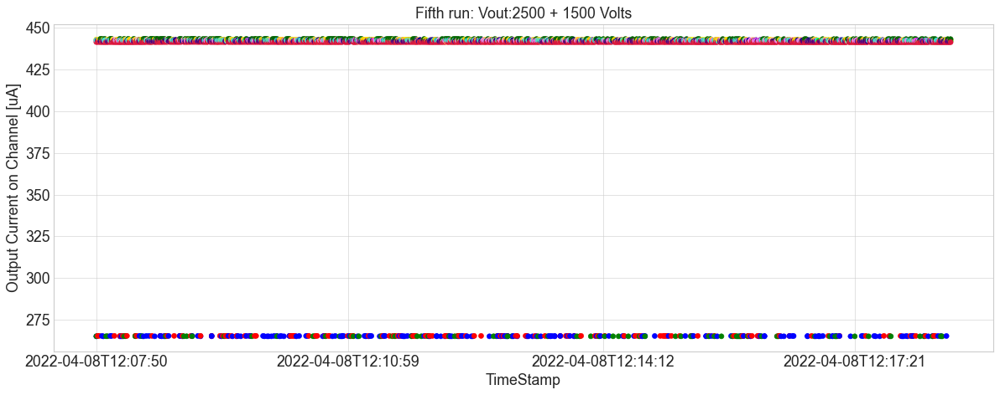

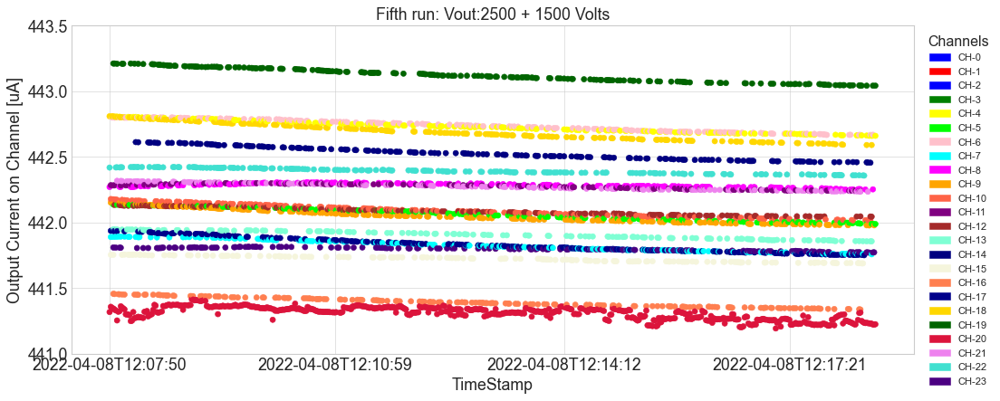

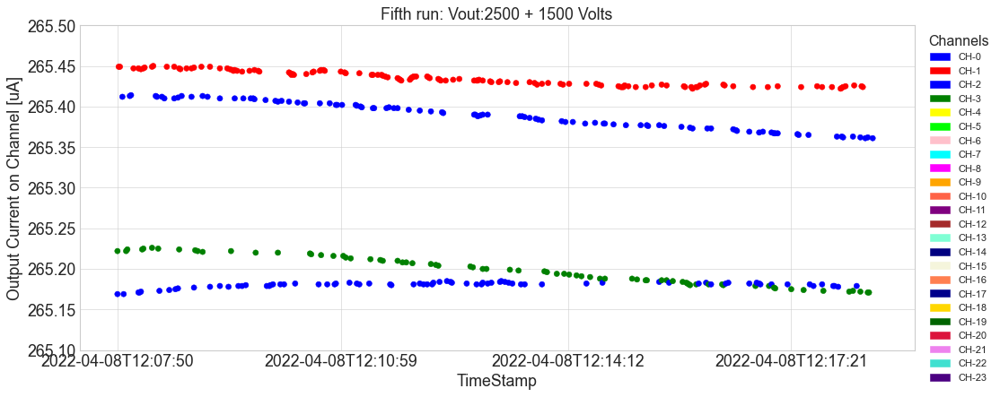

In [752]:
#######################################################################################
## FIFTH RUN:
## 2022-04-08T12:07:50 to 2022-04-08T13:00:00
#######################################################################################
fifth_run = ["2022-04-08T12:07:50","2022-04-08T13:00:00"]
current_5th_run = current.loc[(current['TimeStamp']>=fifth_run[0])&(current['TimeStamp']<=fifth_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(current_5th_run['TimeStamp'],current_5th_run['Value'],c=current_5th_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Current on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.tight_layout()
plt.show()
################################
fig2, ax2 = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax2.scatter(current_5th_run['TimeStamp'],current_5th_run['Value'],c=current_5th_run["Channel"].map(color), s=30, alpha=1)
ax2.set(xlabel='TimeStamp', ylabel='Output Current on Channel [uA]')
ax2.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax2.xaxis.set_minor_locator(mdates.MonthLocator())
ax2.grid(True)
plt.ylim(441,443.5)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.show()
################################
fig3, ax3 = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax3.scatter(current_5th_run['TimeStamp'],current_5th_run['Value'],c=current_5th_run["Channel"].map(color), s=30, alpha=1)
ax3.set(xlabel='TimeStamp', ylabel='Output Current on Channel [uA]')
ax3.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax3.xaxis.set_minor_locator(mdates.MonthLocator())
ax3.grid(True)
plt.ylim(265.1,265.5)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.show()

########################################################################################
## FROM NOW ON I AM PLOTTING THE VOLTAGE OUTPUT
########################################################################################

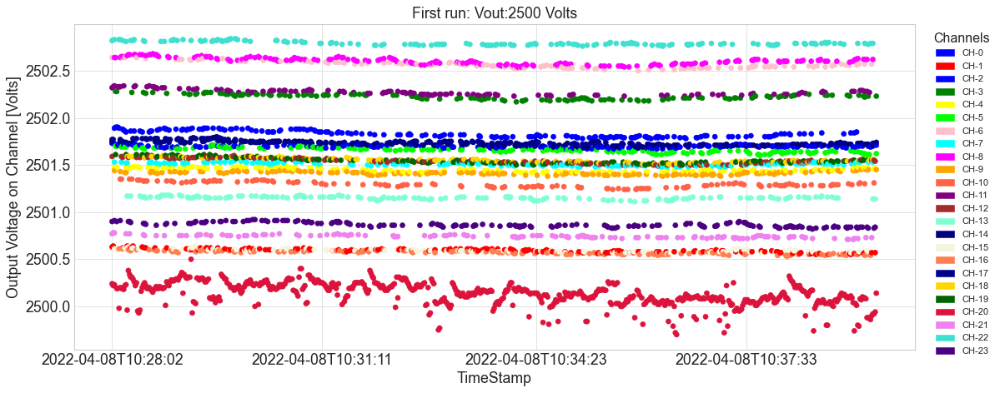

In [753]:
#######################################################################################
## FIRST RUN:
## 2022-04-08T10:28:02 to 2022-04-08T10:39:30
#######################################################################################
#first_run = ["2022-04-08T10:28:02","2022-04-08T10:39:30"]
voltage_1st_run = voltage.loc[(voltage['TimeStamp']>=first_run[0])&(voltage['TimeStamp']<=first_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(voltage_1st_run['TimeStamp'],voltage_1st_run['Value'],c=voltage_1st_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Voltage on Channel [Volts]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
ax.grid(True)
plt.title('First run: Vout:2500 Volts')
plt.tight_layout()
plt.show()

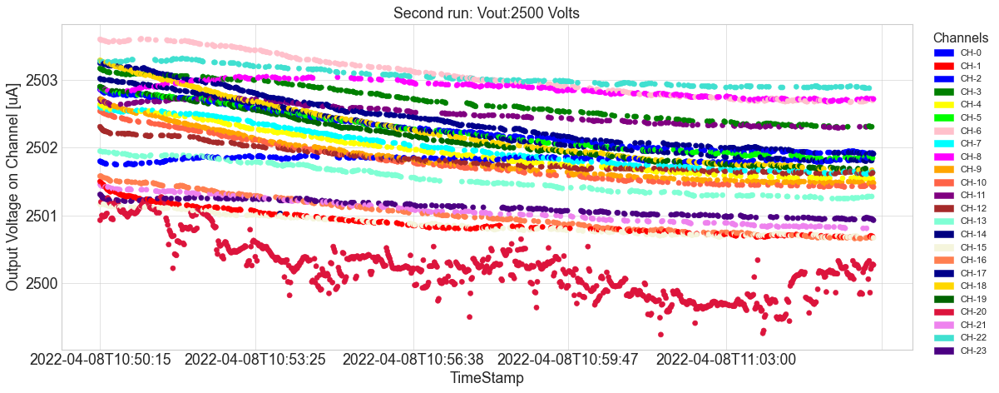

In [754]:
#######################################################################################
## SECOND:
## 2022-04-08T10:50:15 to 2022-04-08T11:06:00
#######################################################################################
#second_run = ["2022-04-08T10:50:15","2022-04-08T11:06:00"]
voltage_2nd_run = voltage.loc[(voltage['TimeStamp']>=second_run[0])&(voltage['TimeStamp']<=second_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(voltage_2nd_run['TimeStamp'],voltage_2nd_run['Value'],c=voltage_2nd_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Voltage on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.rcParams['legend.title_fontsize'] = 'x-large'
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Second run: Vout:2500 Volts')
plt.tight_layout()
plt.show()

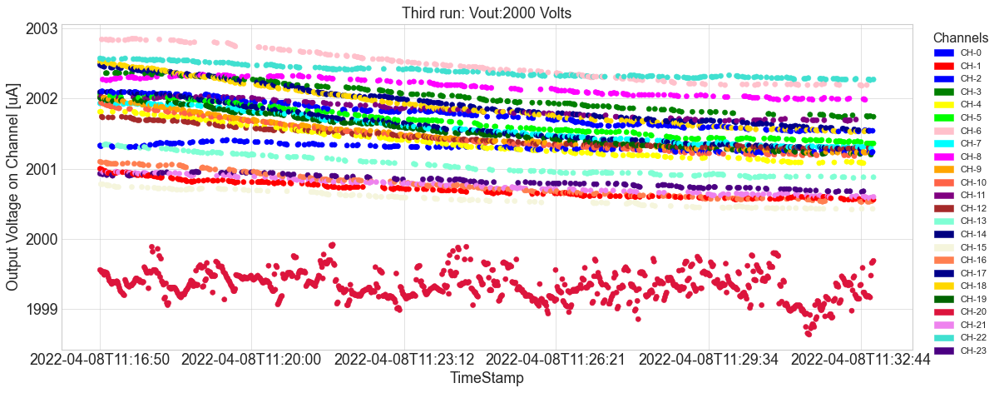

In [755]:
#######################################################################################
## THIRD RUN:
## 2022-04-08T11:16:50 to 2022-04-08T11:33:00
#######################################################################################
##third_run = ["2022-04-08T11:16:50","2022-04-08T11:33:00"]
voltage_3rd_run = voltage.loc[(voltage['TimeStamp']>=third_run[0])&(voltage['TimeStamp']<=third_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(voltage_3rd_run['TimeStamp'],voltage_3rd_run['Value'],c=voltage_3rd_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Voltage on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Third run: Vout:2000 Volts')
plt.tight_layout()
plt.show()

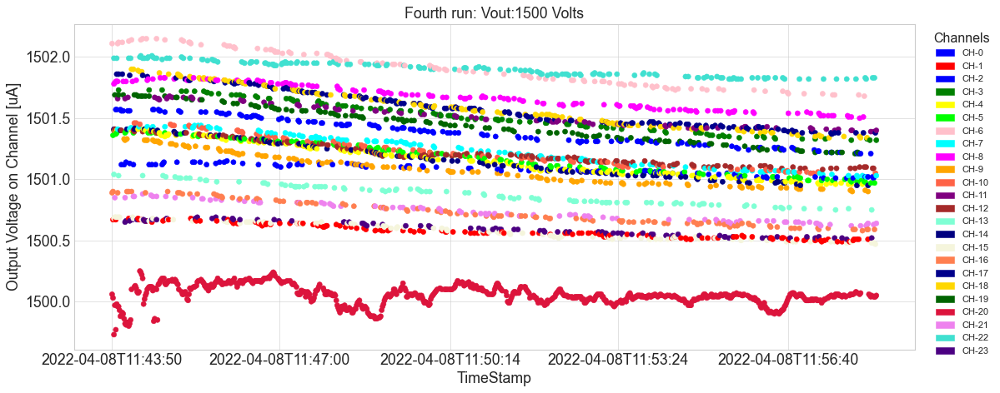

In [756]:
#######################################################################################
## FOURTH RUN:
## 2022-04-08T11:43:50 to 2022-04-08T11:58:20
#######################################################################################
#fourth_run = ["2022-04-08T11:43:50","2022-04-08T11:58:20"]
voltage_4th_run = voltage.loc[(voltage['TimeStamp']>=fourth_run[0])&(voltage['TimeStamp']<=fourth_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(voltage_4th_run['TimeStamp'],voltage_4th_run['Value'],c=voltage_4th_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Voltage on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Fourth run: Vout:1500 Volts')
plt.tight_layout()
plt.show()

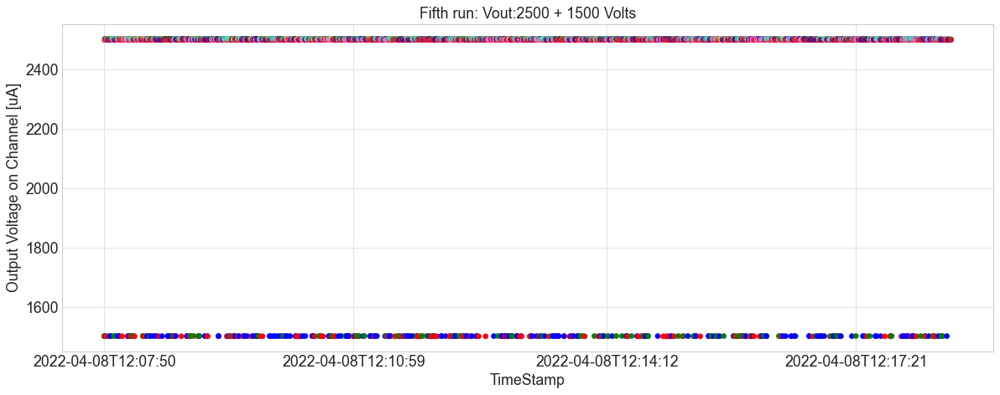

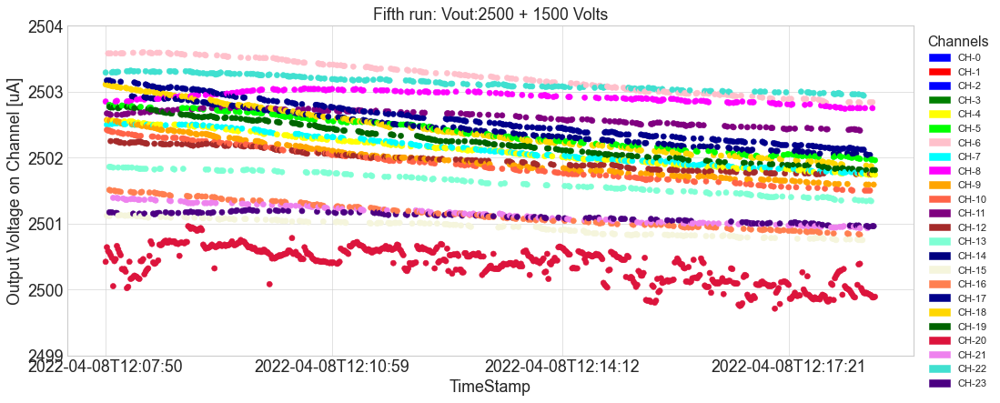

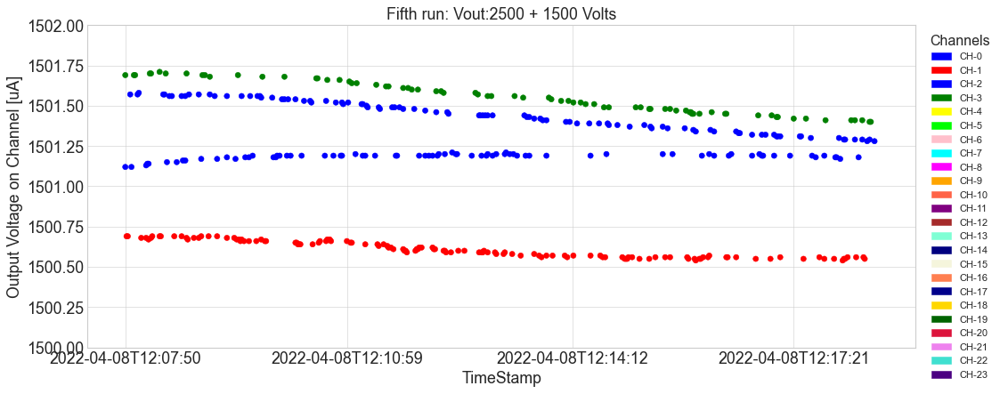

In [758]:
#######################################################################################
## FIFTH RUN:
## 2022-04-08T12:07:50 to 2022-04-08T13:00:00
#######################################################################################
#fifth_run = ["2022-04-08T12:07:50","2022-04-08T13:00:00"]
voltage_5th_run = voltage.loc[(voltage['TimeStamp']>=fifth_run[0])&(voltage['TimeStamp']<=fifth_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(voltage_5th_run['TimeStamp'],voltage_5th_run['Value'],c=voltage_5th_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Output Voltage on Channel [uA]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.tight_layout()
plt.show()
################################
fig2, ax2 = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax2.scatter(voltage_5th_run['TimeStamp'],voltage_5th_run['Value'],c=voltage_5th_run["Channel"].map(color), s=30, alpha=1)
ax2.set(xlabel='TimeStamp', ylabel='Output Voltage on Channel [uA]')
ax2.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax2.xaxis.set_minor_locator(mdates.MonthLocator())
ax2.grid(True)
plt.ylim(2499,2504)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.show()
################################
fig3, ax3 = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax3.scatter(voltage_5th_run['TimeStamp'],voltage_5th_run['Value'],c=voltage_5th_run["Channel"].map(color), s=30, alpha=1)
ax3.set(xlabel='TimeStamp', ylabel='Output Voltage on Channel [uA]')
ax3.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax3.xaxis.set_minor_locator(mdates.MonthLocator())
ax3.grid(True)
plt.ylim(1500,1502)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.show()

########################################################################################
## FROM NOW ON I AM EXTRACTING THE POWER OUT PER CHANNELS
########################################################################################
## DC POWER SUPPLY:
## FOR HV=2500 VOLTS --> LV = 48 VOLTS AND IIN = 1.027 AMPER
## FOR HV=2000 VOLTS --> LV = 48 VOLTS AND IIN = 0.806 AMPER 
## FOR HV=1500 VOLTS --> LV = 48 VOLTS AND IIN = 0.636 AMPER 
## FOR 20 CHANNELS HV=2000 VOLTS AND 4 CHANNELS HV=1500 VOLTS
##      --> LV = 48 VOLTS AND IIN = 0.0.970 AMPER 
########################################################################################

In [695]:
## run1 and run2 at 2500 V
## run3 at 2000 V
## run4 at 1500 V
## run5 at 1500 V CH:0-1-2-3 and 2500V CH:4-5-6....21,22,23
## DC power supply, low voltage input : 48 V
DC_power = [48, 48, 48, 48, 48]
DC_current = [1.027, 1.027,0.806, 0.636, 0.970]

In [656]:
########################################################################################
## CONBINE CURRENT AND VOLTAGE INFORMATION PER CHANNEL
########################################################################################
power = pd.concat([current, voltage], axis=1)
power.head()

,TimeStamp,Board,Channel,Value,Date,Time,Hour,TimeStamp,Board,Channel,Value,Date,Time,Hour
StartTime,,,,,,,,,,,,,,
2022-04-08 10:28:02,2022-04-08T10:28:02,4,0,441.923,2022-04-08,10:28:02,10,2022-04-08T10:28:02,4,0,2501.73,2022-04-08,10:28:02,10
2022-04-08 10:28:02,2022-04-08T10:28:02,4,1,442.323,2022-04-08,10:28:02,10,2022-04-08T10:28:02,4,1,2500.63,2022-04-08,10:28:02,10
2022-04-08 10:28:02,2022-04-08T10:28:02,4,6,442.631,2022-04-08,10:28:02,10,2022-04-08T10:28:02,4,6,2502.64,2022-04-08,10:28:02,10
2022-04-08 10:28:02,2022-04-08T10:28:02,4,11,442.224,2022-04-08,10:28:02,10,2022-04-08T10:28:02,4,11,2502.32,2022-04-08,10:28:02,10
2022-04-08 10:28:02,2022-04-08T10:28:02,4,12,442.017,2022-04-08,10:28:02,10,2022-04-08T10:28:02,4,12,2501.59,2022-04-08,10:28:02,10


In [657]:
########################################################################################
## REMOVE UNNECCESSARY INFOS
########################################################################################
power.drop(['Date','Time','Hour'],axis=1,inplace=True)
power.head()

,TimeStamp,Board,Channel,Value,TimeStamp,Board,Channel,Value
StartTime,,,,,,,,
2022-04-08 10:28:02,2022-04-08T10:28:02,4,0,441.923,2022-04-08T10:28:02,4,0,2501.73
2022-04-08 10:28:02,2022-04-08T10:28:02,4,1,442.323,2022-04-08T10:28:02,4,1,2500.63
2022-04-08 10:28:02,2022-04-08T10:28:02,4,6,442.631,2022-04-08T10:28:02,4,6,2502.64
2022-04-08 10:28:02,2022-04-08T10:28:02,4,11,442.224,2022-04-08T10:28:02,4,11,2502.32
2022-04-08 10:28:02,2022-04-08T10:28:02,4,12,442.017,2022-04-08T10:28:02,4,12,2501.59


In [658]:
########################################################################################
## RENAME THE COLUMNS
########################################################################################
power.columns = ['TimeStamp','Board','Channel','Imon','T','B','C','Vmon']
power.head()

,TimeStamp,Board,Channel,Imon,T,B,C,Vmon
StartTime,,,,,,,,
2022-04-08 10:28:02,2022-04-08T10:28:02,4,0,441.923,2022-04-08T10:28:02,4,0,2501.73
2022-04-08 10:28:02,2022-04-08T10:28:02,4,1,442.323,2022-04-08T10:28:02,4,1,2500.63
2022-04-08 10:28:02,2022-04-08T10:28:02,4,6,442.631,2022-04-08T10:28:02,4,6,2502.64
2022-04-08 10:28:02,2022-04-08T10:28:02,4,11,442.224,2022-04-08T10:28:02,4,11,2502.32
2022-04-08 10:28:02,2022-04-08T10:28:02,4,12,442.017,2022-04-08T10:28:02,4,12,2501.59


In [659]:
########################################################################################
## REMOVE UNNECCESSARY INFOS
########################################################################################
power.drop(['T','B','C'],axis=1,inplace=True)
power.head()

,TimeStamp,Board,Channel,Imon,Vmon
StartTime,,,,,
2022-04-08 10:28:02,2022-04-08T10:28:02,4,0,441.923,2501.73
2022-04-08 10:28:02,2022-04-08T10:28:02,4,1,442.323,2500.63
2022-04-08 10:28:02,2022-04-08T10:28:02,4,6,442.631,2502.64
2022-04-08 10:28:02,2022-04-08T10:28:02,4,11,442.224,2502.32
2022-04-08 10:28:02,2022-04-08T10:28:02,4,12,442.017,2501.59


In [660]:
########################################################################################
## ADD THE POWER AS A NEW COLUMN: POWER = IMON*VMON
########################################################################################
power['Pout']=power['Imon']*power['Vmon']*1E-6
power.head()

,TimeStamp,Board,Channel,Imon,Vmon,Pout
StartTime,,,,,,
2022-04-08 10:28:02,2022-04-08T10:28:02,4,0,441.923,2501.73,1.105572
2022-04-08 10:28:02,2022-04-08T10:28:02,4,1,442.323,2500.63,1.106086
2022-04-08 10:28:02,2022-04-08T10:28:02,4,6,442.631,2502.64,1.107746
2022-04-08 10:28:02,2022-04-08T10:28:02,4,11,442.224,2502.32,1.106586
2022-04-08 10:28:02,2022-04-08T10:28:02,4,12,442.017,2501.59,1.105745


########################################################################################
## PLOT THE POWER PER CHANNEL AND PER RUN
########################################################################################

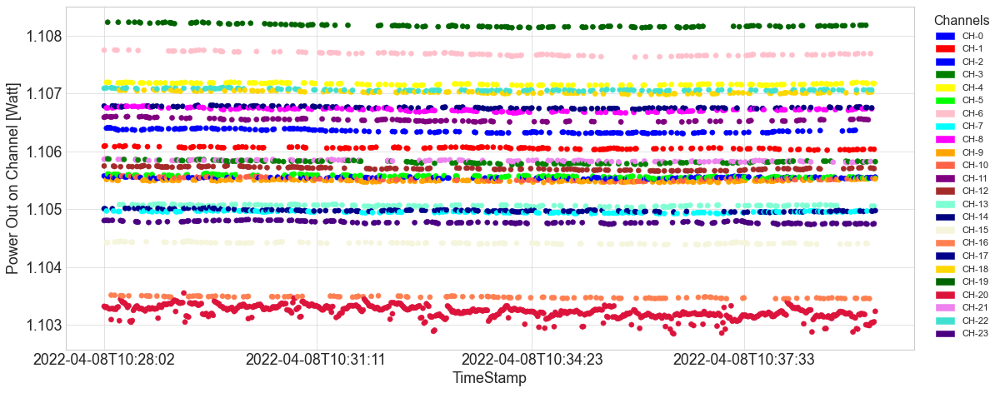

In [661]:
#######################################################################################
## FIRST RUN:
## 2022-04-08T10:28:02 to 2022-04-08T10:39:30
#######################################################################################
power_1st_run = power.loc[(power['TimeStamp']>=first_run[0])&(power['TimeStamp']<=first_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(power_1st_run['TimeStamp'],power_1st_run['Pout'],c=power_1st_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Power Out on Channel [Watt]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
ax.grid(True)
plt.title('First run: Vout:2500 Volts')
plt.tight_layout()
plt.show()

In [662]:
power_1st_run.dtypes

TimeStamp     object
Board          int64
Channel        int64
Imon         float64
Vmon         float64
Pout         float64
dtype: object

In [679]:
AvePout_run1 = power_1st_run.groupby(['Channel'])['Pout'].agg([np.mean, np.std])
print(AvePout_run1)
print('Average of all channels:',AvePout_run1['mean'].mean())
Ptot_run1 = AvePout_run1['mean'].sum()
print('Total Power output:',Ptot_run1)
#fig, ax = plt.subplots()
#AvePout['mean'].plot(yerr=AvePout['std'], kind='bar')

             mean       std
Channel                    
0        1.105542  0.000011
1        1.106054  0.000017
2        1.106348  0.000030
3        1.105814  0.000024
4        1.107162  0.000017
5        1.105566  0.000022
6        1.107683  0.000031
7        1.104949  0.000015
8        1.106717  0.000030
9        1.105488  0.000014
10       1.105521  0.000025
11       1.106542  0.000027
12       1.105702  0.000026
13       1.105061  0.000012
14       1.106756  0.000017
15       1.104413  0.000014
16       1.103478  0.000016
17       1.104978  0.000021
18       1.107017  0.000021
19       1.108170  0.000027
20       1.103225  0.000106
21       1.105834  0.000013
22       1.107061  0.000017
23       1.104772  0.000021
Average of all channels: 1.1058272358709524
Total Power output: 26.539853660902864


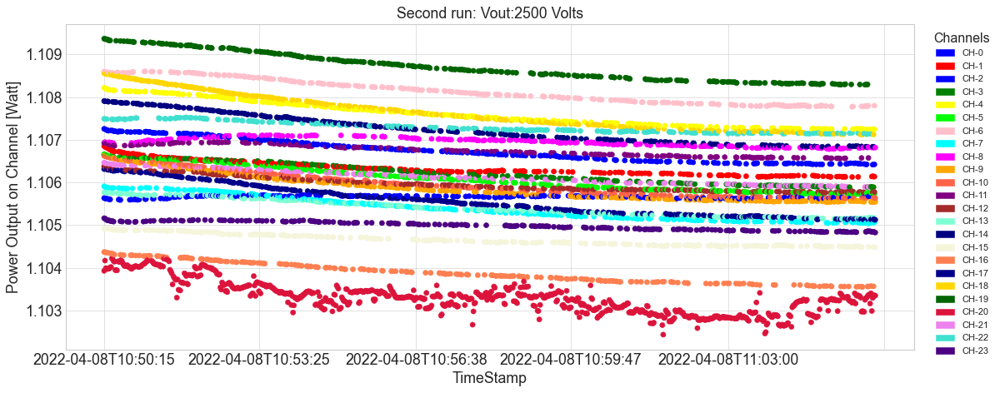

In [759]:
#######################################################################################
## SECOND:
## 2022-04-08T10:50:15 to 2022-04-08T11:06:00
#######################################################################################
power_2nd_run = power.loc[(power['TimeStamp']>=second_run[0])&(power['TimeStamp']<=second_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(power_2nd_run['TimeStamp'],power_2nd_run['Pout'],c=power_2nd_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Power Output on Channel [Watt]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.rcParams['legend.title_fontsize'] = 'x-large'
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Second run: Vout:2500 Volts')
plt.tight_layout()
plt.show()

In [681]:
AvePout_run2 = power_2nd_run.groupby(['Channel'])['Pout'].agg([np.mean, np.std])
print(AvePout_run2)
print('Average of all channels:',AvePout_run2['mean'].mean())
Ptot_run2 = AvePout_run2['mean'].sum()
print('Total Power output:',Ptot_run2)
#fig, ax = plt.subplots()
#AvePout['mean'].plot(yerr=AvePout['std'], kind='bar')

             mean       std
Channel                    
0        1.105662  0.000028
1        1.106364  0.000189
2        1.106773  0.000265
3        1.106223  0.000237
4        1.107646  0.000298
5        1.106104  0.000292
6        1.108136  0.000283
7        1.105405  0.000276
8        1.106952  0.000097
9        1.105933  0.000335
10       1.106023  0.000310
11       1.106756  0.000129
12       1.105960  0.000175
13       1.105424  0.000193
14       1.107301  0.000343
15       1.104649  0.000135
16       1.103912  0.000243
17       1.105627  0.000363
18       1.107745  0.000434
19       1.108737  0.000332
20       1.103299  0.000373
21       1.106143  0.000171
22       1.107289  0.000127
23       1.104982  0.000097
Average of all channels: 1.1062102683341482
Total Power output: 26.54904644001956


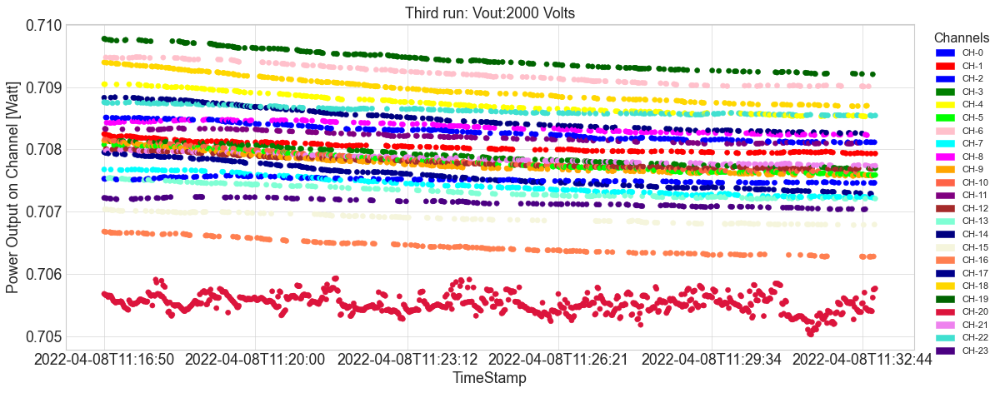

In [760]:
#######################################################################################
## THIRD RUN:
## 2022-04-08T11:16:50 to 2022-04-08T11:33:00
#######################################################################################
power_3rd_run = power.loc[(power['TimeStamp']>=third_run[0])&(power['TimeStamp']<=third_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(power_3rd_run['TimeStamp'],power_3rd_run['Pout'],c=power_3rd_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Power Output on Channel [Watt]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Third run: Vout:2000 Volts')
plt.tight_layout()
plt.show()

In [683]:
AvePout_run3 = power_3rd_run.groupby(['Channel'])['Pout'].agg([np.mean, np.std])
print(AvePout_run3)
print('Average of all channels:',AvePout_run3['mean'].mean())
Ptot_run3 = AvePout_run3['mean'].sum()
print('Total Power output:',Ptot_run3)
#fig, ax = plt.subplots()
#AvePout['mean'].plot(yerr=AvePout['std'], kind='bar')

             mean       std
Channel                    
0        0.707510  0.000035
1        0.708050  0.000087
2        0.708291  0.000127
3        0.707912  0.000142
4        0.708751  0.000157
5        0.707790  0.000153
6        0.709217  0.000154
7        0.707413  0.000148
8        0.708358  0.000087
9        0.707801  0.000165
10       0.707867  0.000166
11       0.708207  0.000085
12       0.707798  0.000100
13       0.707337  0.000107
14       0.708516  0.000182
15       0.706899  0.000077
16       0.706454  0.000123
17       0.707603  0.000198
18       0.709002  0.000214
19       0.709471  0.000167
20       0.705527  0.000143
21       0.707848  0.000081
22       0.708629  0.000067
23       0.707146  0.000061
Average of all channels: 0.7078915709151515
Total Power output: 16.98939770196364


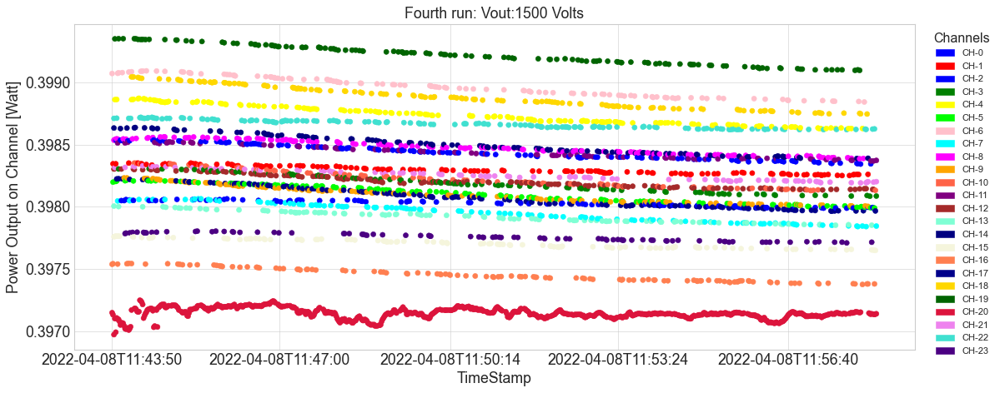

In [761]:
#######################################################################################
## FOURTH RUN:
## 2022-04-08T11:43:50 to 2022-04-08T11:58:20
#######################################################################################
power_4th_run = power.loc[(voltage['TimeStamp']>=fourth_run[0])&(power['TimeStamp']<=fourth_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(power_4th_run['TimeStamp'],power_4th_run['Pout'],c=power_4th_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Power Output on Channel [Watt]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.title('Fourth run: Vout:1500 Volts')
plt.tight_layout()
plt.show()

In [685]:
AvePout_run4 = power_4th_run.groupby(['Channel'])['Pout'].agg([np.mean, np.std])
print(AvePout_run4)
print('Average of all channels:',AvePout_run4['mean'].mean())
Ptot_run4 = AvePout_run4['mean'].sum()
print('Total Power output:',Ptot_run4)
#fig, ax = plt.subplots()
#AvePout['mean'].plot(yerr=AvePout['std'], kind='bar')

             mean       std
Channel                    
0        0.398029  0.000023
1        0.398295  0.000030
2        0.398441  0.000059
3        0.398189  0.000067
4        0.398734  0.000075
5        0.398102  0.000070
6        0.398965  0.000078
7        0.397955  0.000071
8        0.398479  0.000055
9        0.398107  0.000070
10       0.398229  0.000067
11       0.398440  0.000050
12       0.398204  0.000049
13       0.397923  0.000043
14       0.398502  0.000075
15       0.397706  0.000035
16       0.397453  0.000052
17       0.398076  0.000079
18       0.398882  0.000090
19       0.399216  0.000078
20       0.397148  0.000042
21       0.398253  0.000042
22       0.398663  0.000031
23       0.397758  0.000030
Average of all channels: 0.39823961900056176
Total Power output: 9.557750856013483


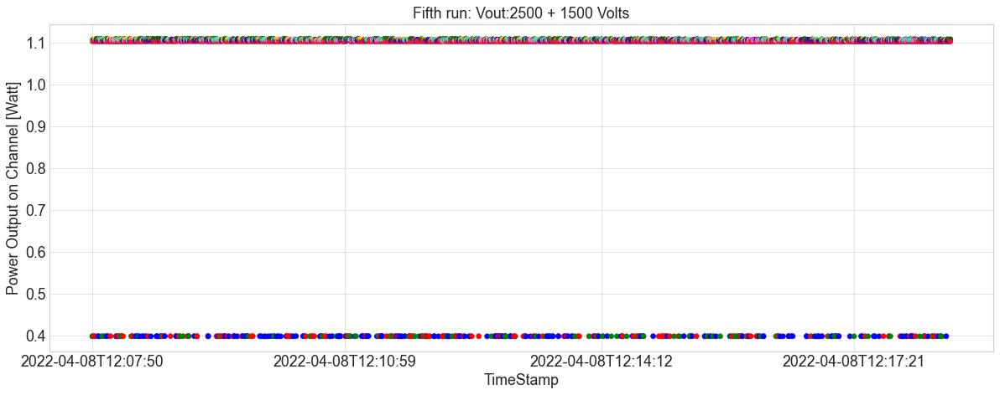

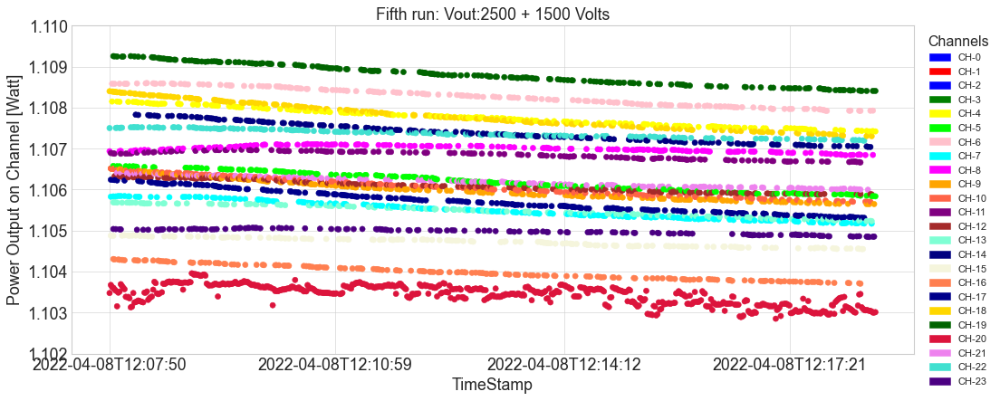

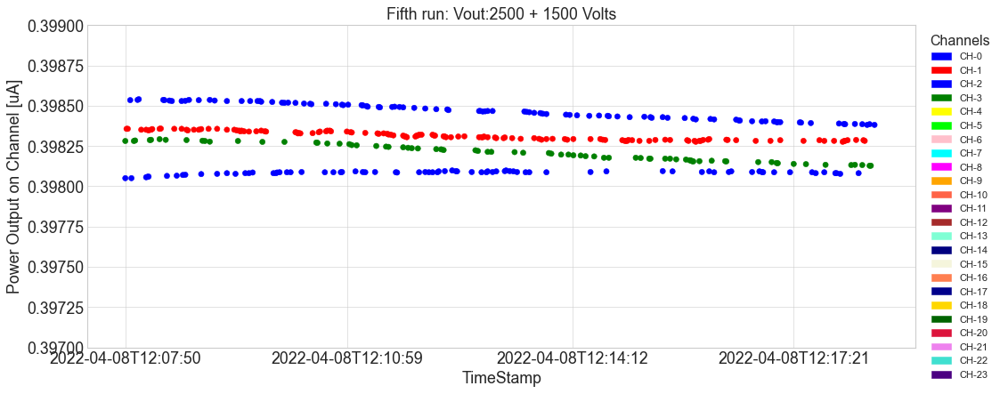

In [762]:
#######################################################################################
## FIFTH RUN:
## 2022-04-08T12:07:50 to 2022-04-08T13:00:00
#######################################################################################
power_5th_run = power.loc[(power['TimeStamp']>=fifth_run[0])&(power['TimeStamp']<=fifth_run[1])]
fig, ax = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax.scatter(power_5th_run['TimeStamp'],power_5th_run['Pout'],c=power_5th_run["Channel"].map(color), s=30, alpha=1)
ax.set(xlabel='TimeStamp', ylabel='Power Output on Channel [Watt]')
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax.xaxis.set_minor_locator(mdates.MonthLocator())
ax.grid(True)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.tight_layout()
plt.show()
################################
fig2, ax2 = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax2.scatter(power_5th_run['TimeStamp'],power_5th_run['Pout'],c=power_5th_run["Channel"].map(color), s=30, alpha=1)
ax2.set(xlabel='TimeStamp', ylabel='Power Output on Channel [Watt]')
ax2.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax2.xaxis.set_minor_locator(mdates.MonthLocator())
ax2.grid(True)
plt.ylim(1.102,1.11)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.show()
################################
fig3, ax3 = plt.subplots(figsize=(15,6),dpi=80, edgecolor='k')
ax3.scatter(power_5th_run['TimeStamp'],power_5th_run['Pout'],c=power_5th_run["Channel"].map(color), s=30, alpha=1)
ax3.set(xlabel='TimeStamp', ylabel='Power Output on Channel [uA]')
ax3.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
ax3.xaxis.set_minor_locator(mdates.MonthLocator())
ax3.grid(True)
plt.ylim(0.397,0.399)
plt.title('Fifth run: Vout:2500 + 1500 Volts')
plt.legend(handles=channels,title="Channels",bbox_to_anchor=(1.1, 1),loc='upper right',fontsize='medium',fancybox = True, shadow = True)
plt.show()

In [687]:
AvePout_run5 = power_5th_run.groupby(['Channel'])['Pout'].agg([np.mean, np.std])
print(AvePout_run5)
print('Average of all channels:',AvePout_run5['mean'].mean())
Ptot_run5 = AvePout_run5['mean'].sum()
print('Total Power output:',Ptot_run5)
#fig, ax = plt.subplots()
#AvePout['mean'].plot(yerr=AvePout['std'], kind='bar')

             mean       std
Channel                    
0        0.398085  0.000010
1        0.398314  0.000026
2        0.398466  0.000051
3        0.398209  0.000053
4        1.107765  0.000221
5        1.106195  0.000229
6        1.108267  0.000217
7        1.105483  0.000209
8        1.106999  0.000075
9        1.106029  0.000258
10       1.106093  0.000235
11       1.106837  0.000096
12       1.106097  0.000146
13       1.105470  0.000146
14       1.107407  0.000239
15       1.104719  0.000105
16       1.103986  0.000175
17       1.105716  0.000277
18       1.107848  0.000319
19       1.108819  0.000258
20       1.103437  0.000239
21       1.106188  0.000128
22       1.107374  0.000101
23       1.104976  0.000065
Average of all channels: 0.9882823777675096
Total Power output: 23.71877706642023


#######################################################################################
## POWER EFFICIENCY
## IT IS GIVEN BY THE RATIO OF POWER_OUT TO POWER_IN
## PIN = VIN*IIN
#######################################################################################

In [705]:
Power_Ch = [AvePout_run1['mean'],AvePout_run2['mean'],AvePout_run3['mean'],AvePout_run4['mean'],AvePout_run5['mean']]
Power_In = [i * j for i, j in zip(DC_power, DC_current)]
Power_Out = [Ptot_run1,Ptot_run2,Ptot_run3,Ptot_run4,Ptot_run5]
Power_Eff = [i / j for i, j in zip(Power_Out, Power_In)]
##print(Power_Ch)
print(Power_In)
print(Power_Out)
print(Power_Eff)

[49.29599999999999, 49.29599999999999, 38.688, 30.528, 46.56]
[26.539853660902864, 26.54904644001956, 16.98939770196364, 9.557750856013483, 23.71877706642023]
[0.5383774273957901, 0.5385639086339574, 0.4391386916347094, 0.3130814614784291, 0.5094239060657266]


#######################################################################################
#######################################################################################
#######################################################################################
##  CHANNEL BY CHANNEL VOLTAGE AND CURRENT OUTPUT
##  FIRST RUN
#######################################################################################
#######################################################################################
#######################################################################################

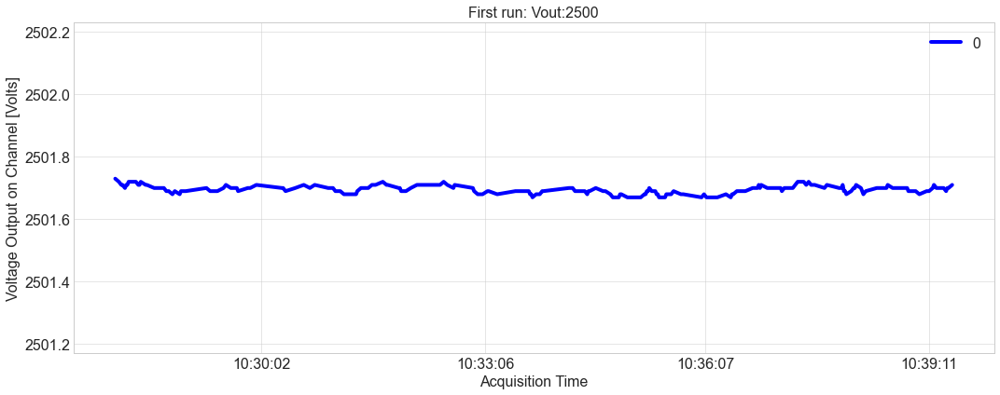

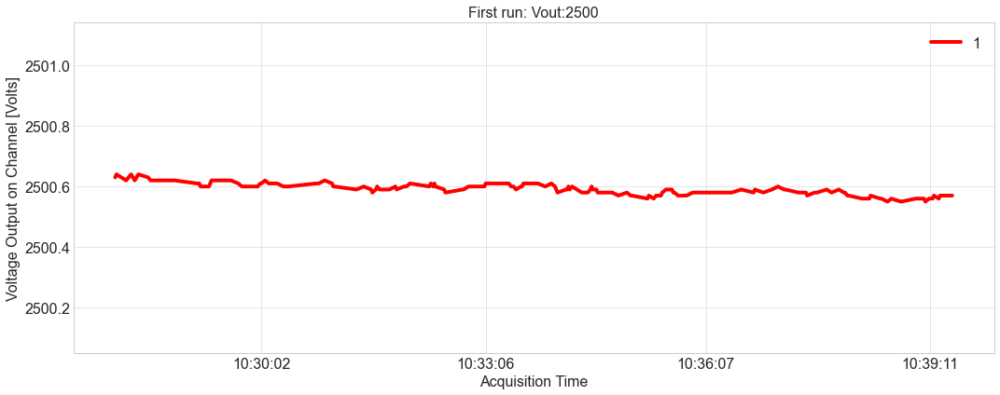

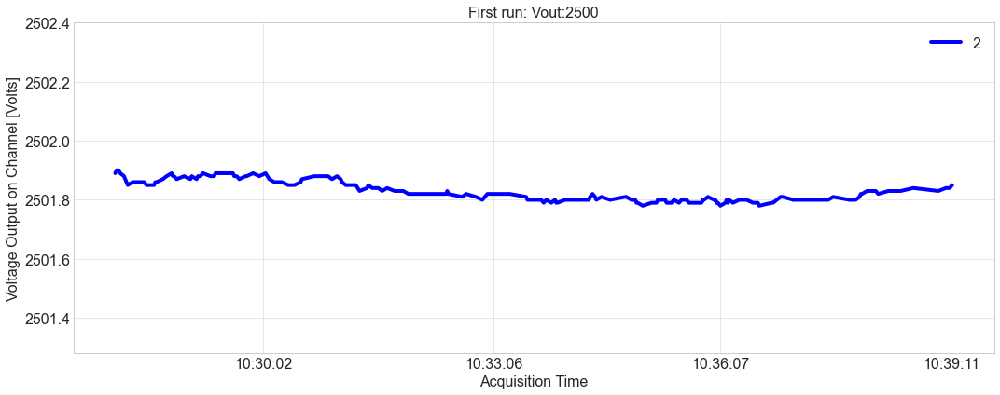

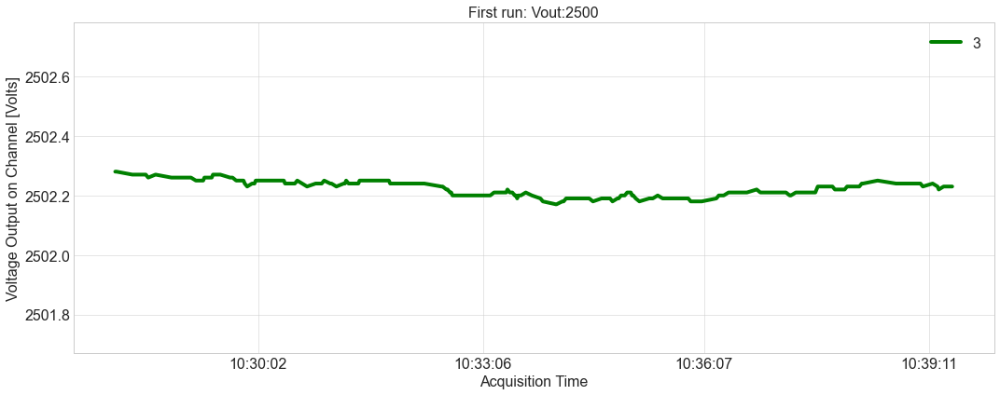

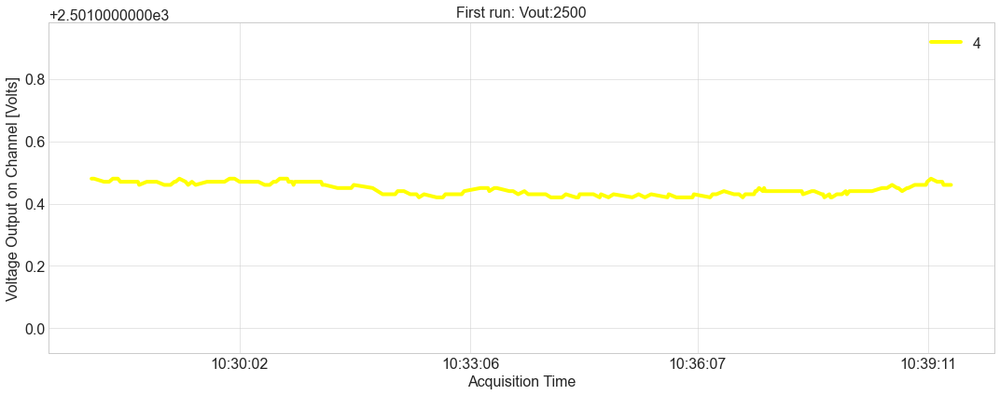

...

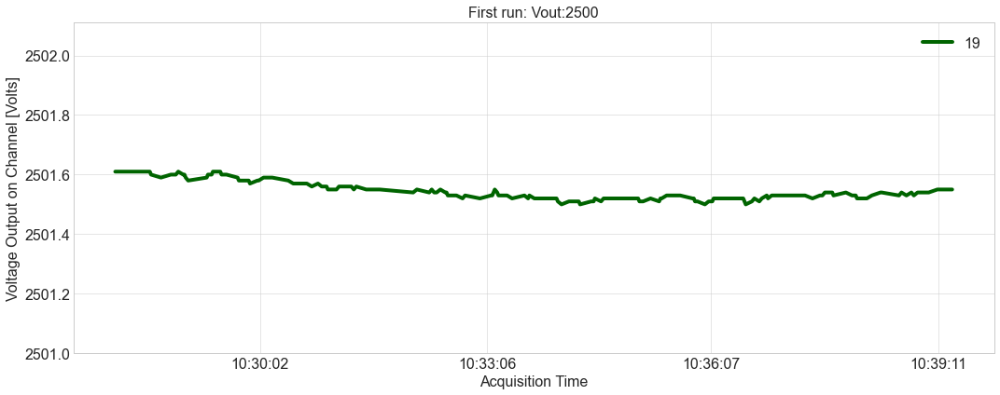

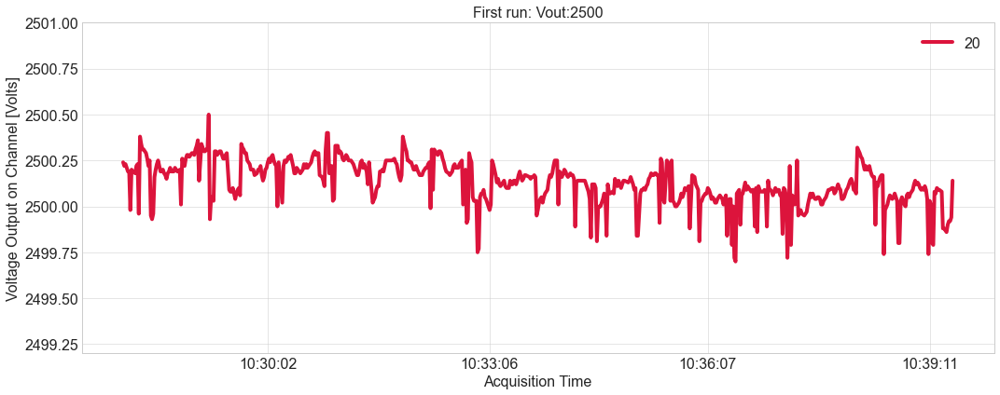

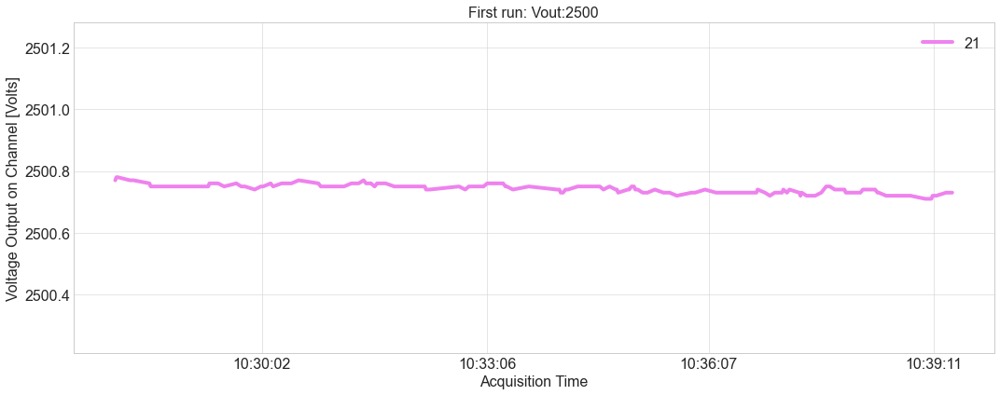

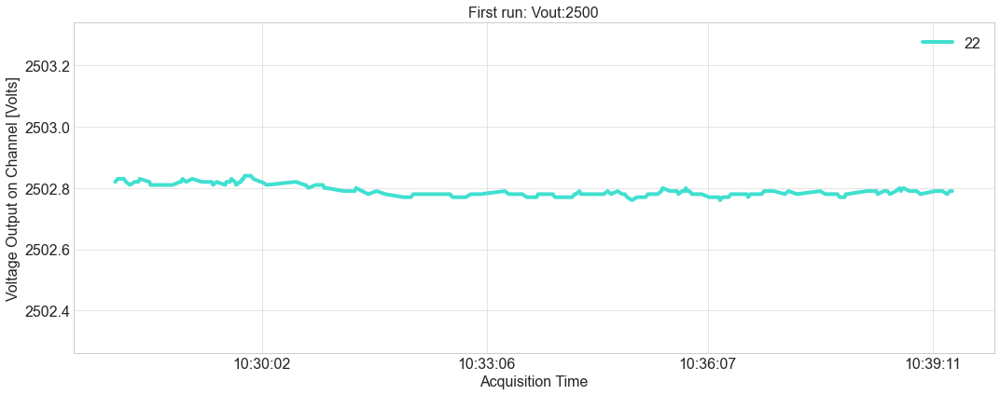

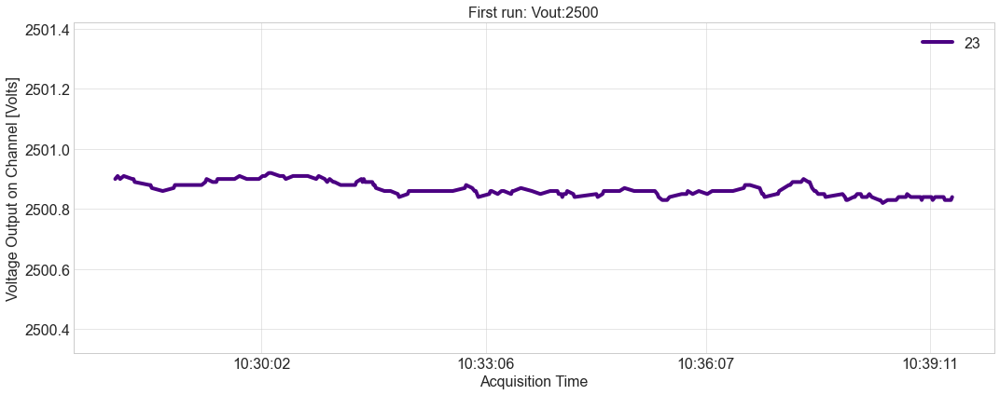

In [763]:
for ch, group in voltage_1st_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.5
    ymax=group['Value'].max()+0.5
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Voltage Output on Channel [Volts]')
    plt.ylim(ymin,ymax)
    plt.title('First run: Vout:2500')
    plt.tight_layout()
    plt.show()    

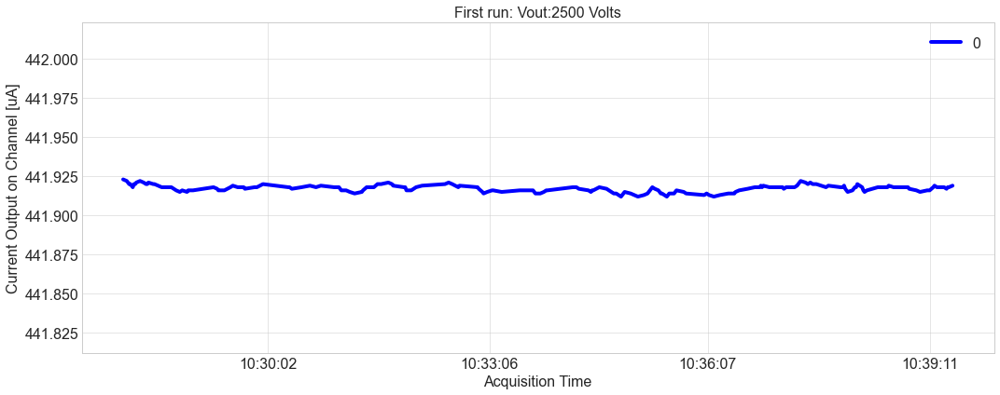

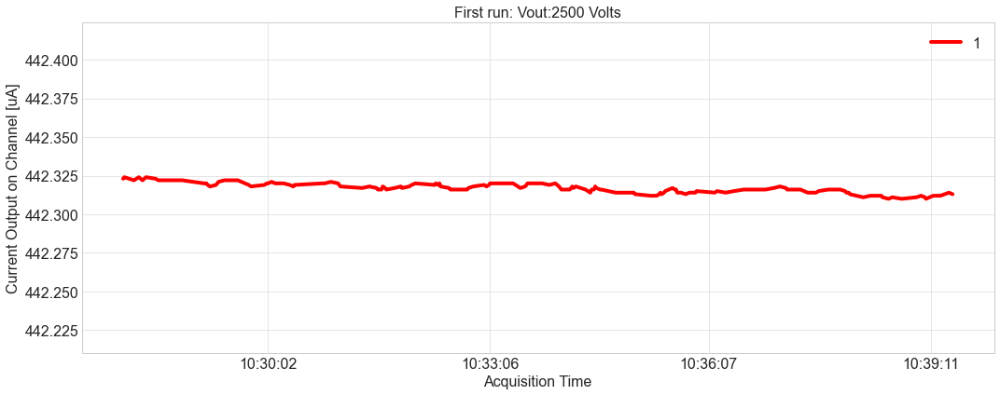

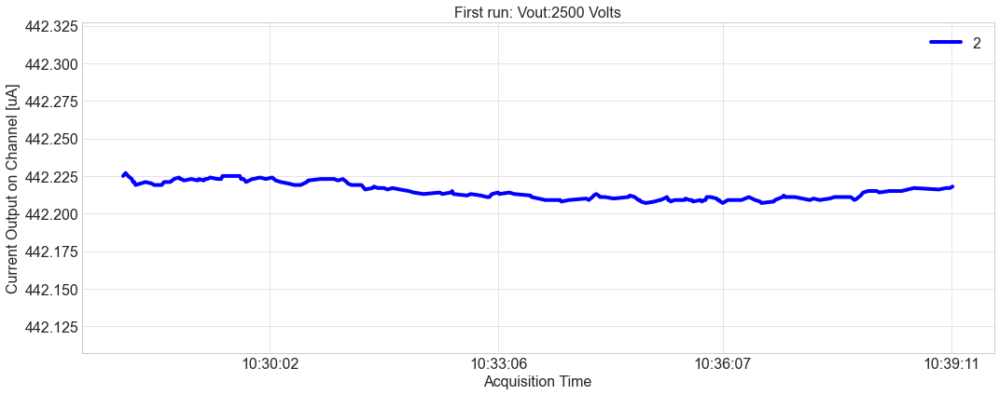

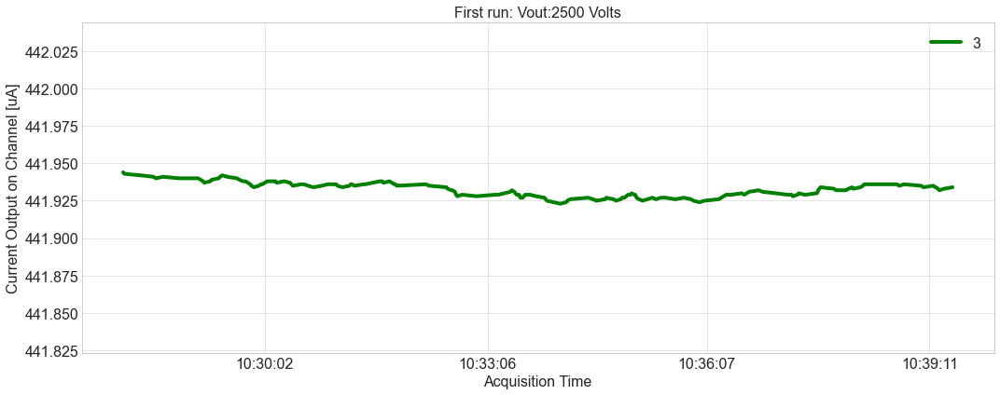

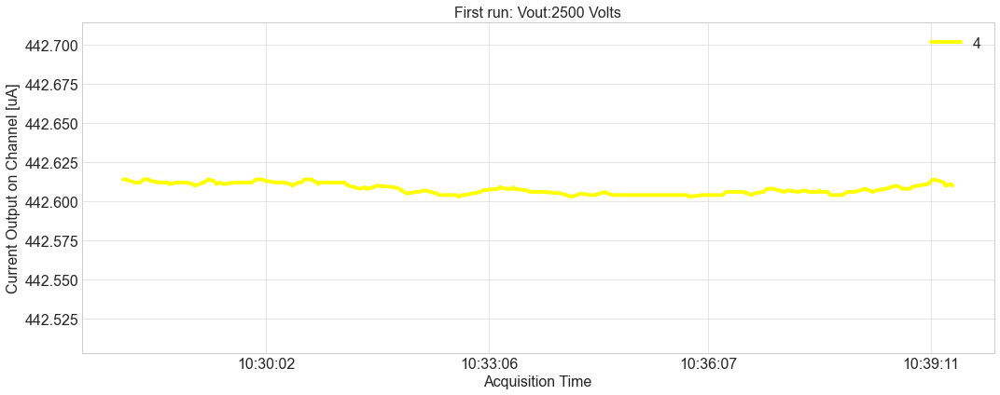

...

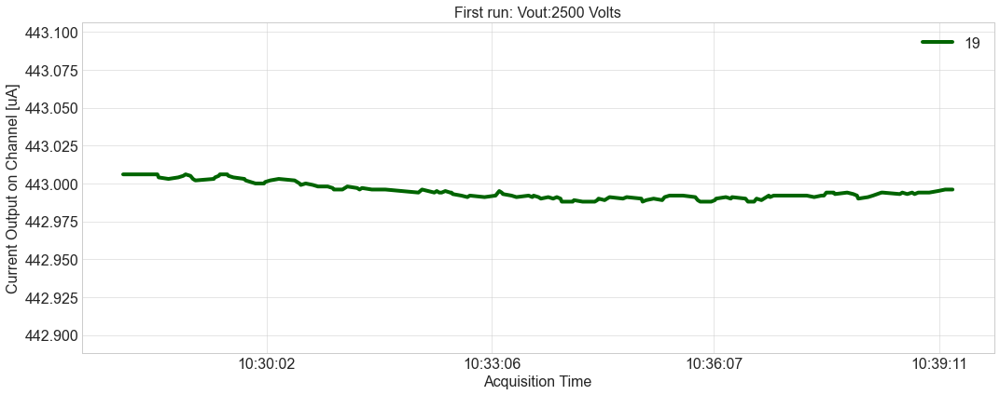

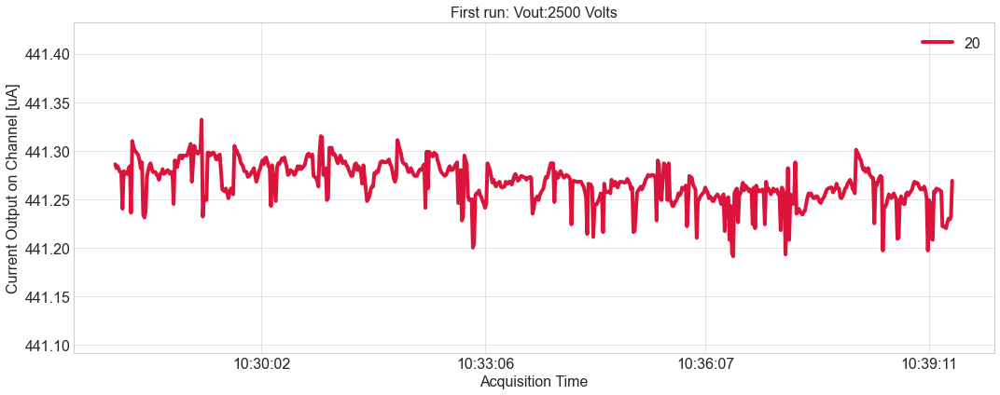

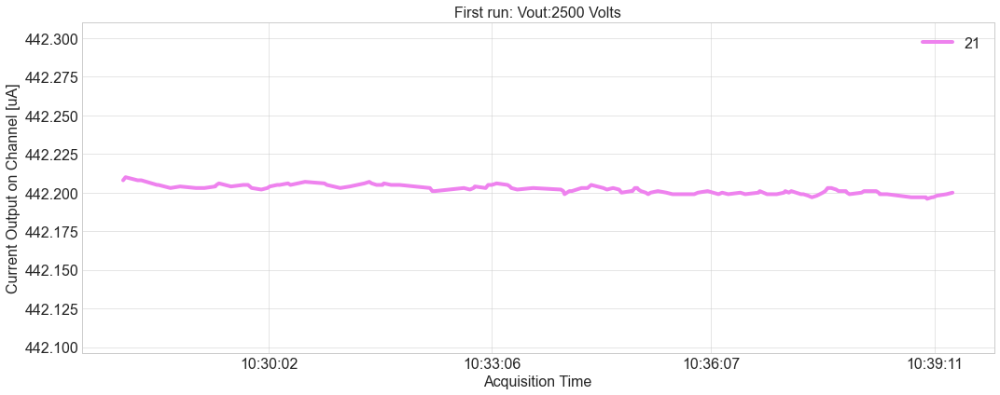

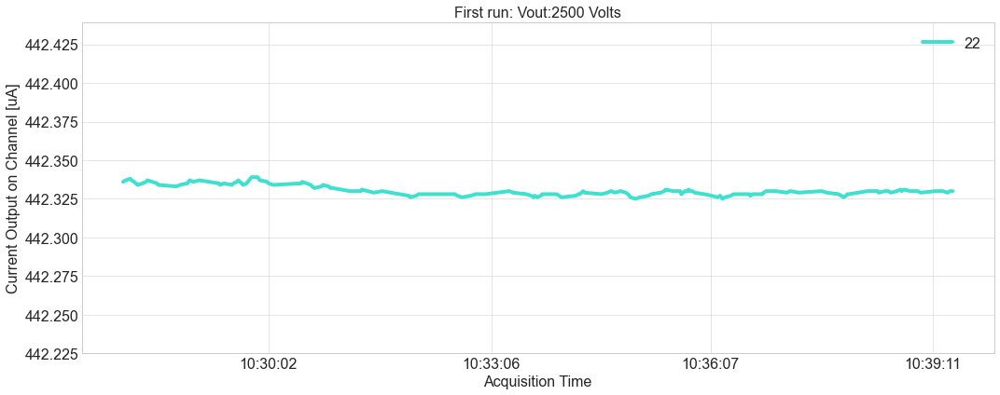

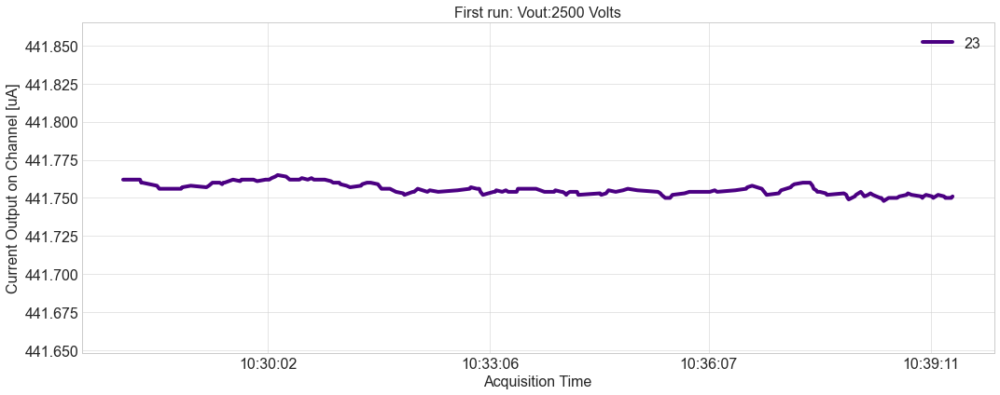

In [765]:
for ch, group in current_1st_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.1
    ymax=group['Value'].max()+0.1
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Current Output on Channel [uA]')
    plt.ylim(ymin,ymax)
    plt.title('First run: Vout:2500 Volts')
    plt.tight_layout()
    plt.show()    

#######################################################################################
#######################################################################################
#######################################################################################
##  CHANNEL BY CHANNEL VOLTAGE AND CURRENT OUTPUT
##  SECOND RUN
#######################################################################################
#######################################################################################
#######################################################################################

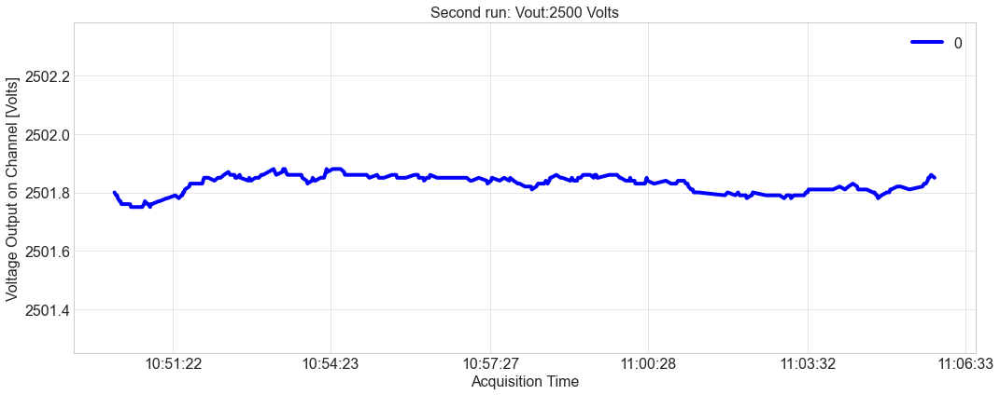

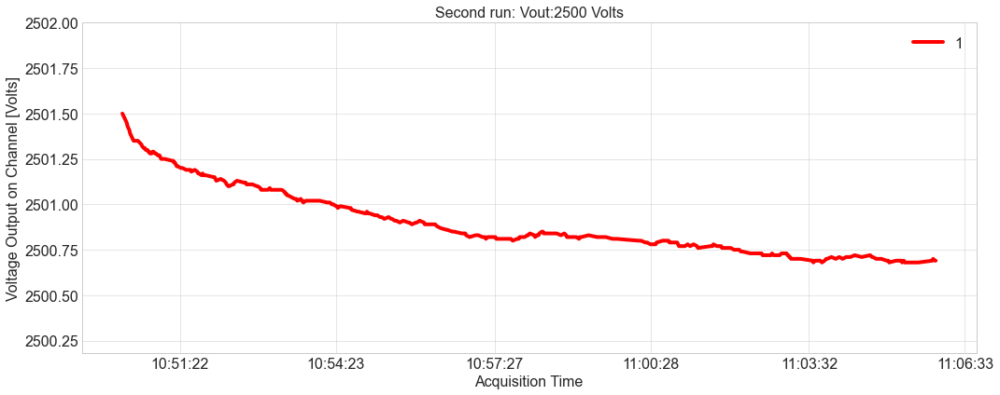

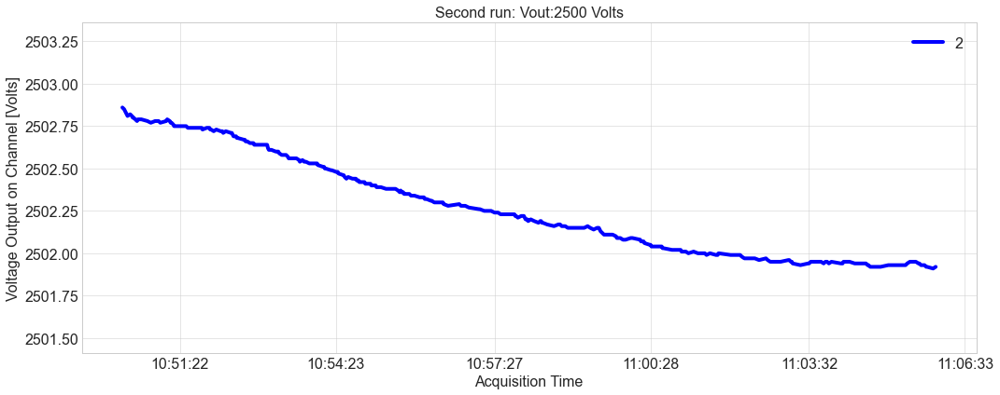

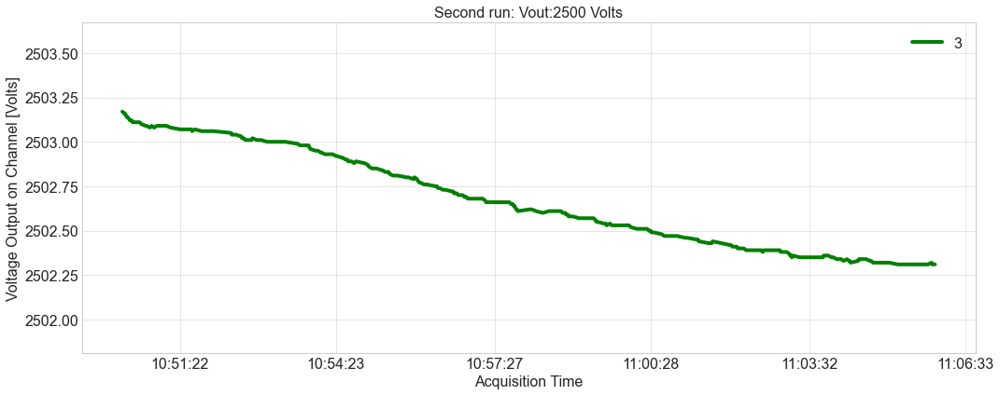

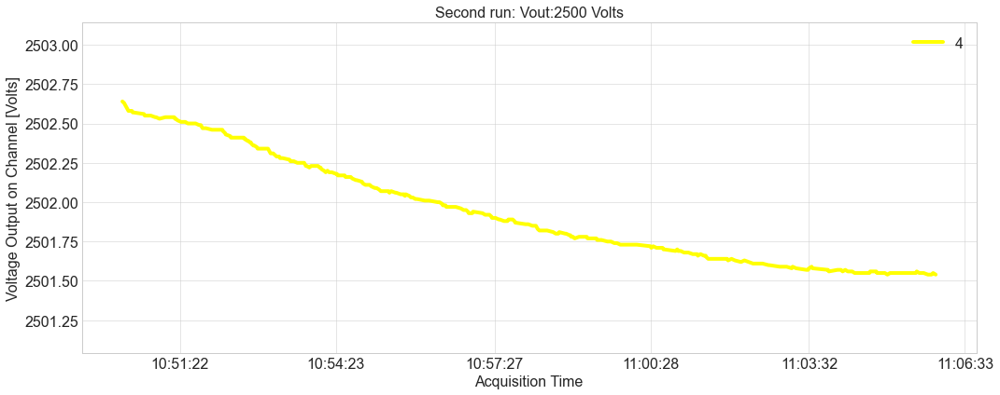

...

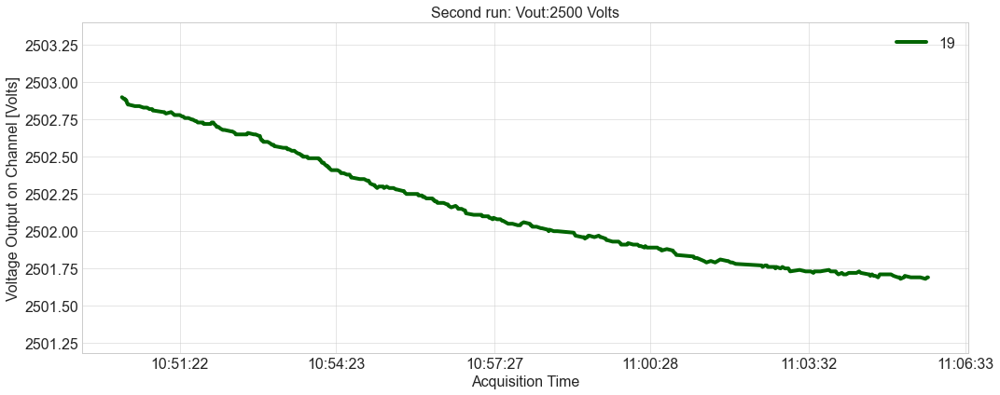

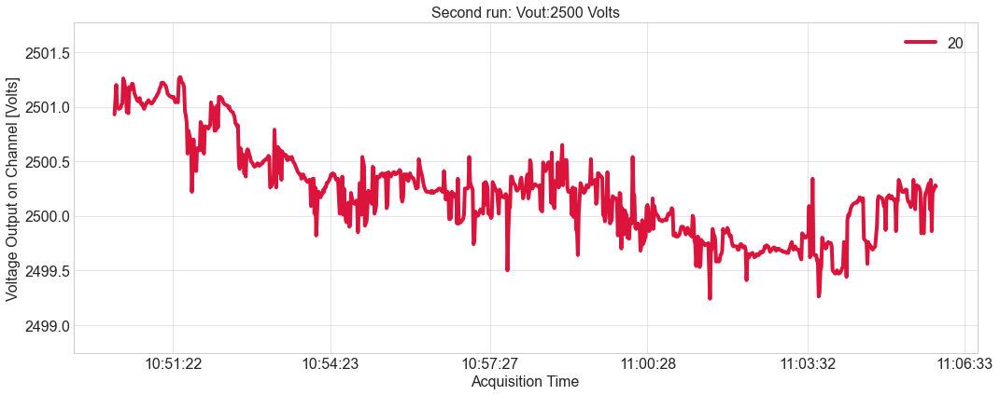

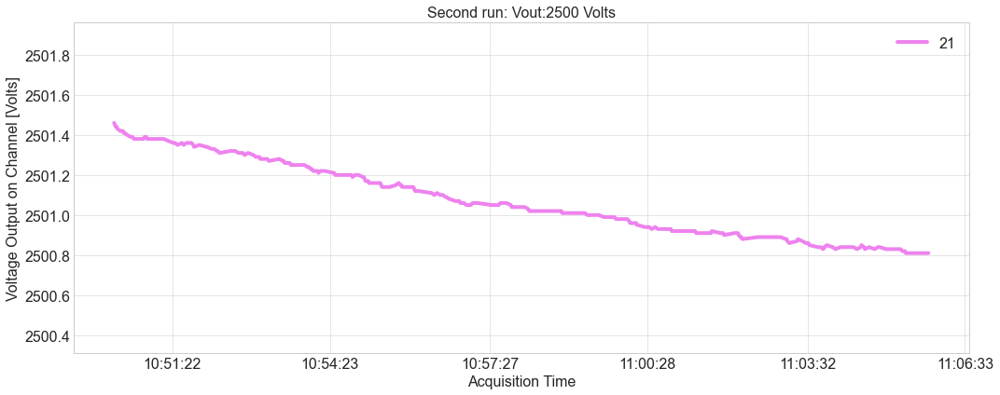

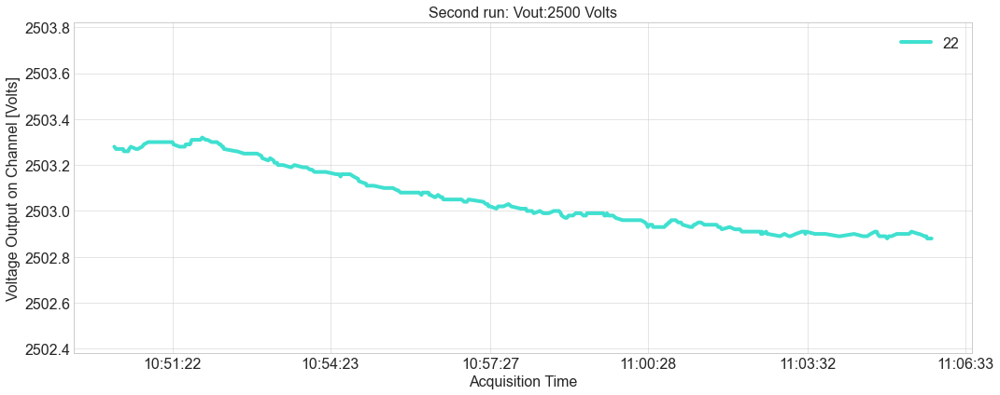

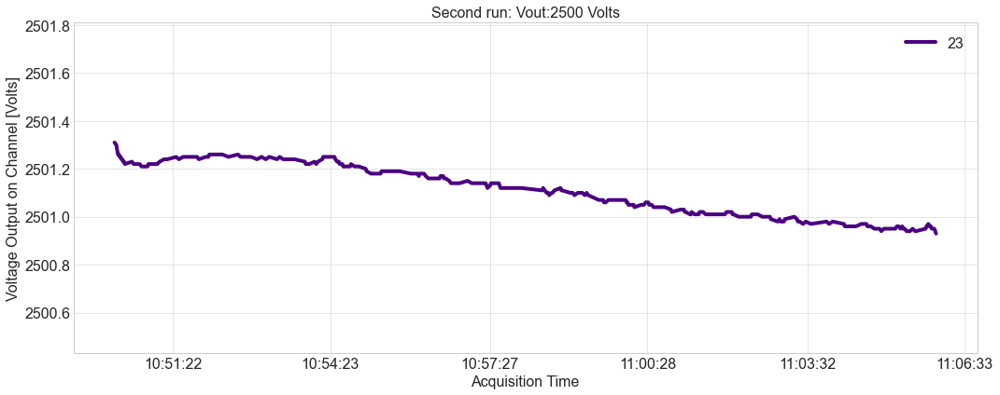

In [766]:
for ch, group in voltage_2nd_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.5
    ymax=group['Value'].max()+0.5
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Voltage Output on Channel [Volts]')
    plt.ylim(ymin,ymax)
    plt.title('Second run: Vout:2500 Volts')
    plt.tight_layout()
    plt.show()    

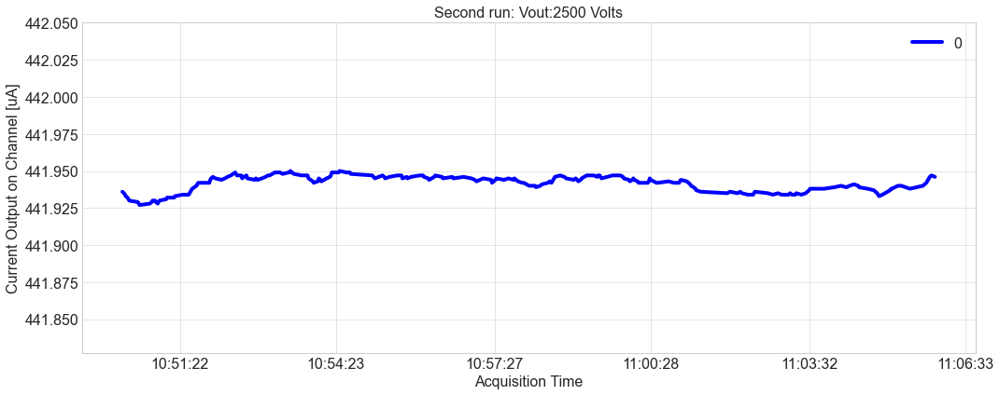

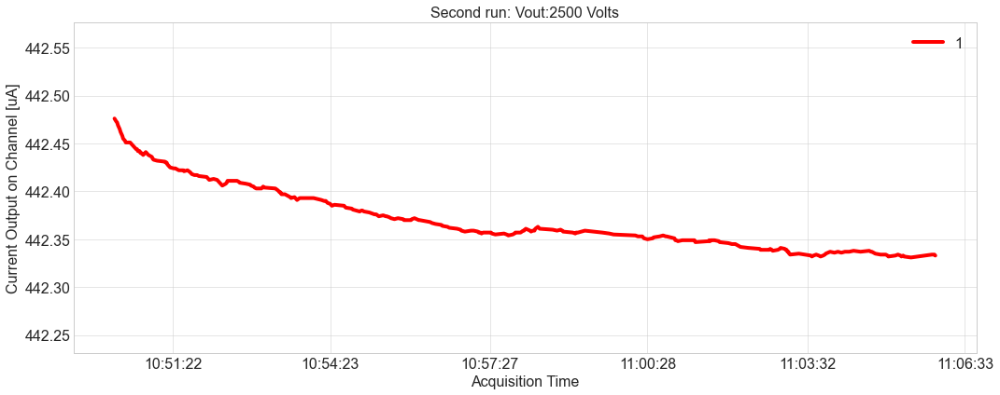

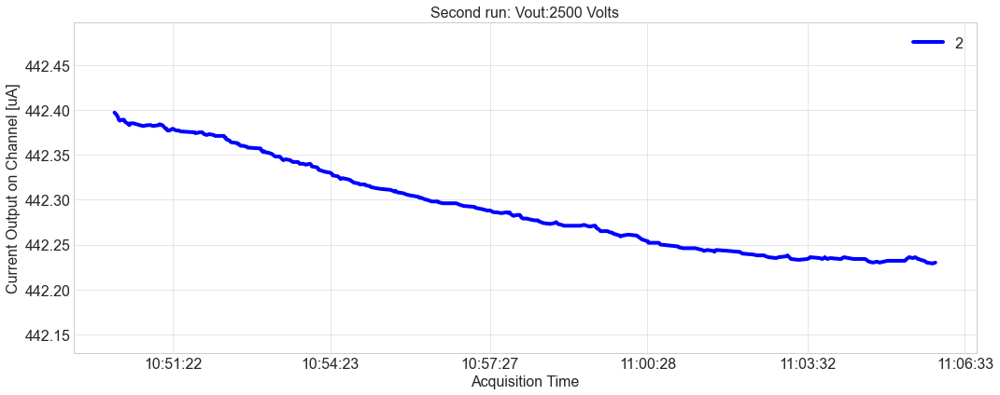

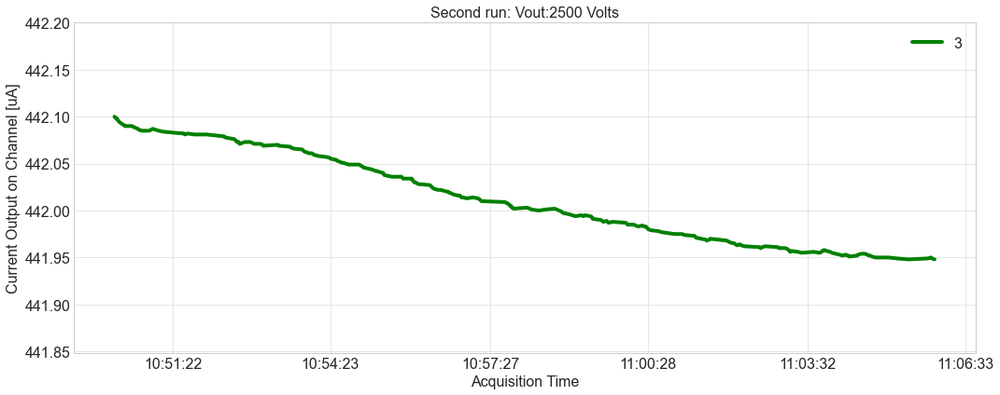

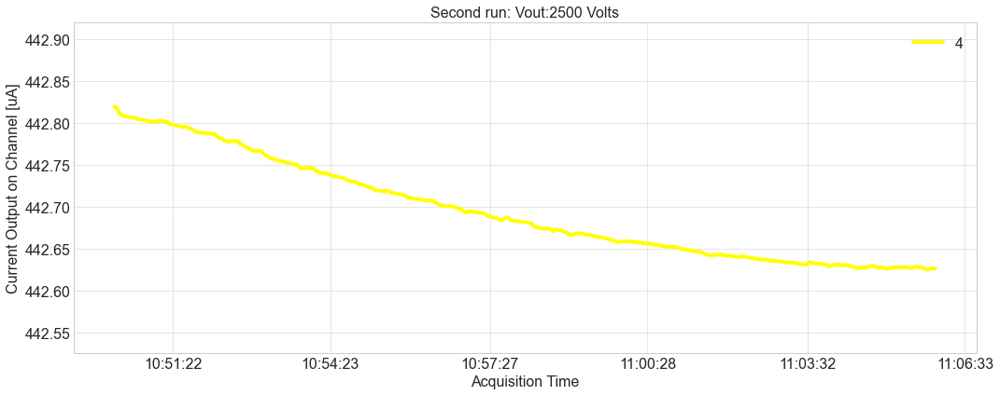

...

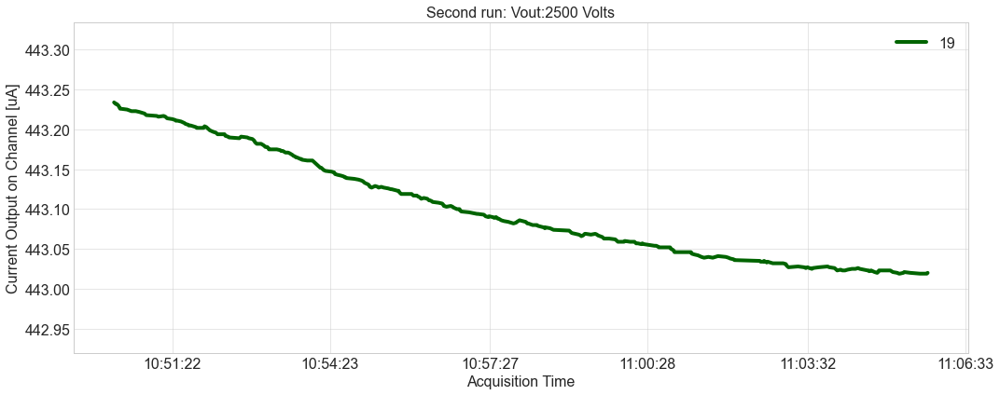

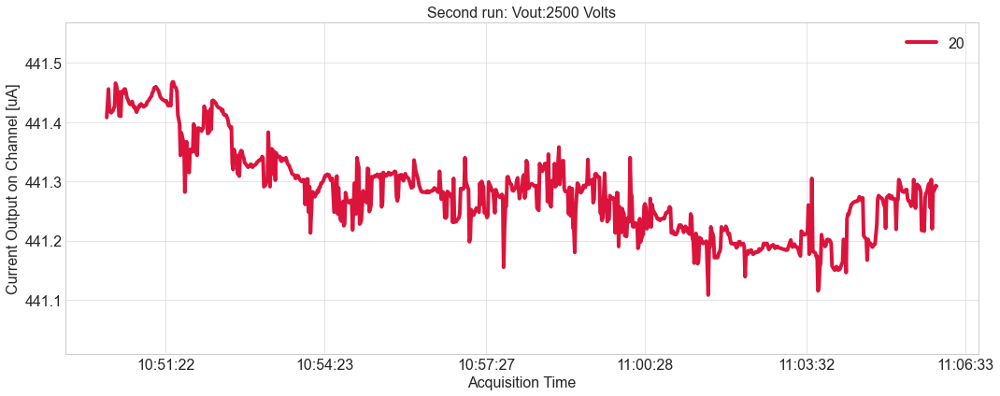

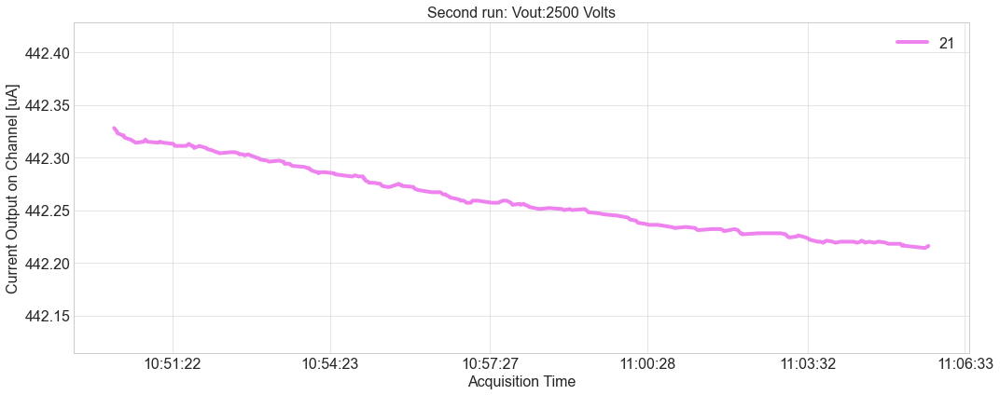

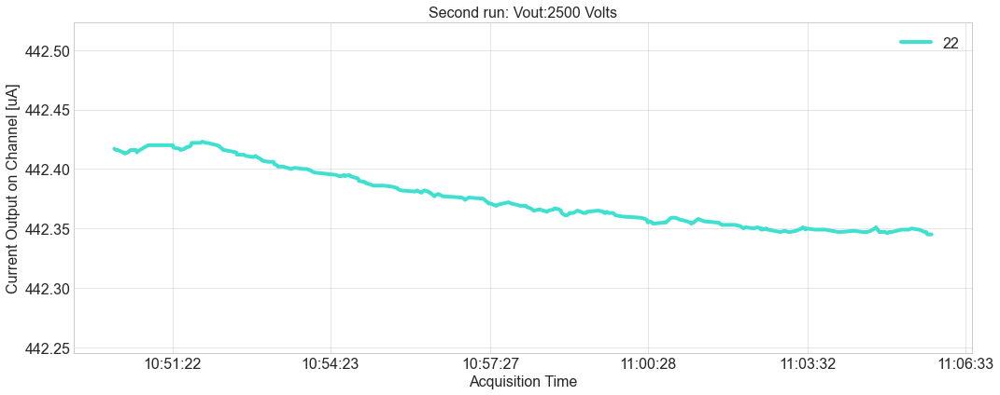

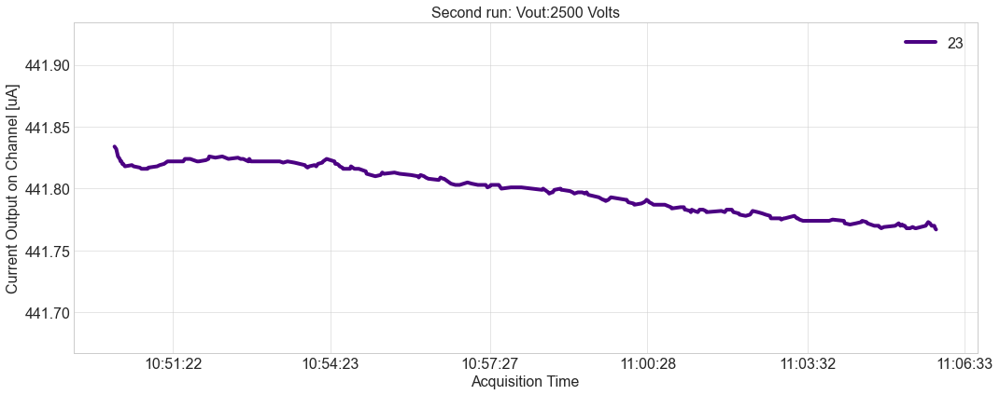

In [767]:
for ch, group in current_2nd_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.1
    ymax=group['Value'].max()+0.1
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Current Output on Channel [uA]')
    plt.ylim(ymin,ymax)
    plt.title('Second run: Vout:2500 Volts')
    plt.tight_layout()
    plt.show()    

#######################################################################################
#######################################################################################
#######################################################################################
##  CHANNEL BY CHANNEL VOLTAGE AND CURRENT OUTPUT
##  THIRD RUN
#######################################################################################
#######################################################################################
#######################################################################################

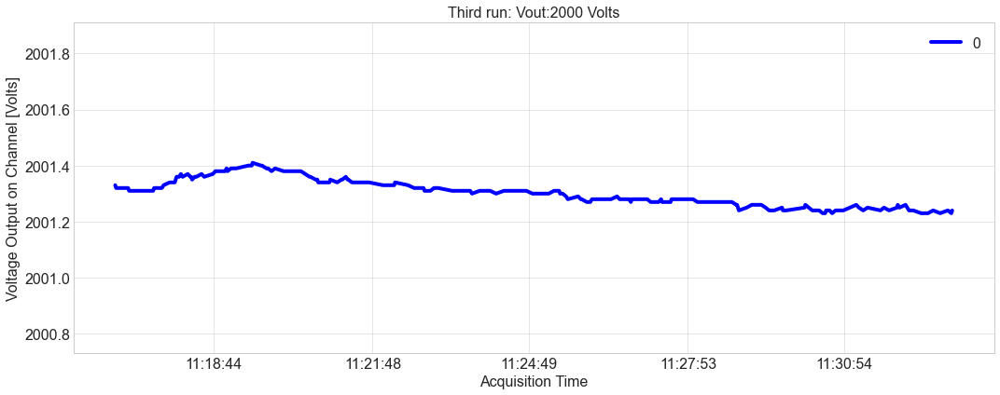

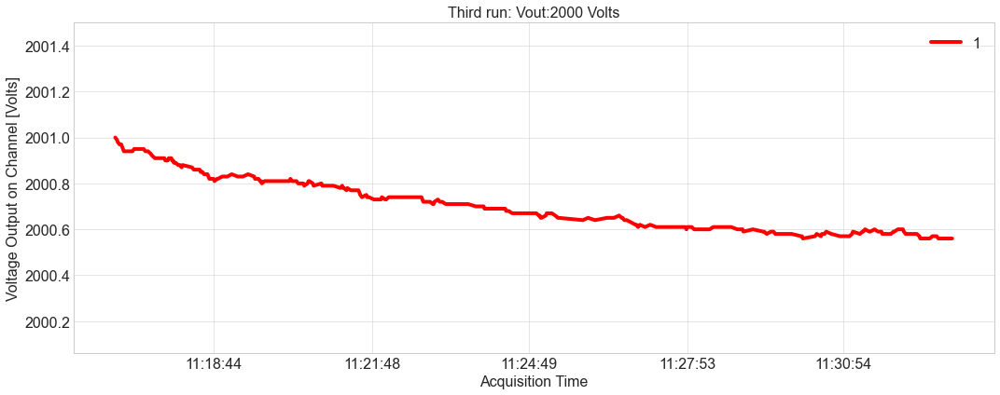

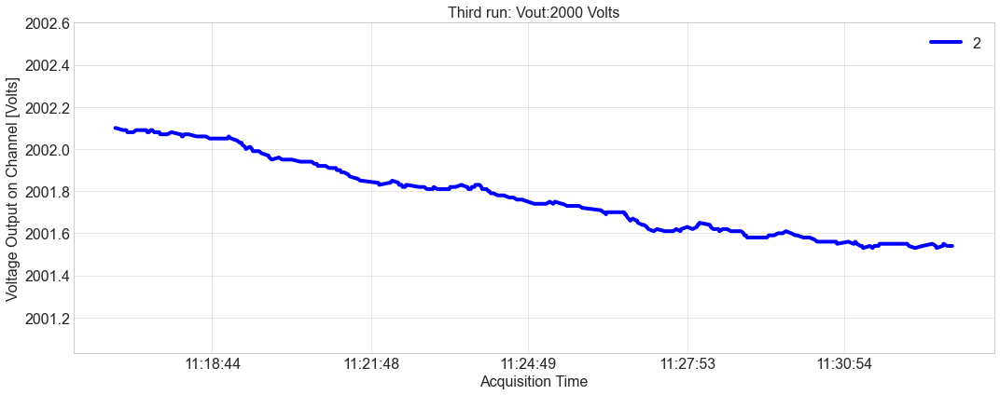

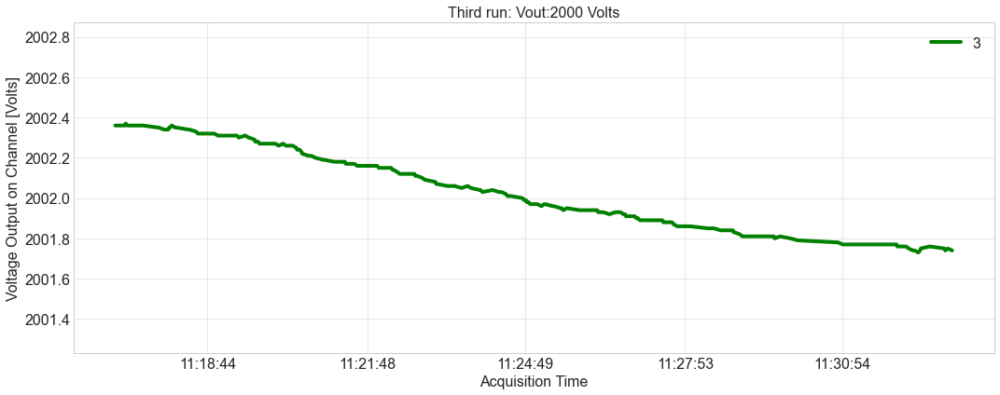

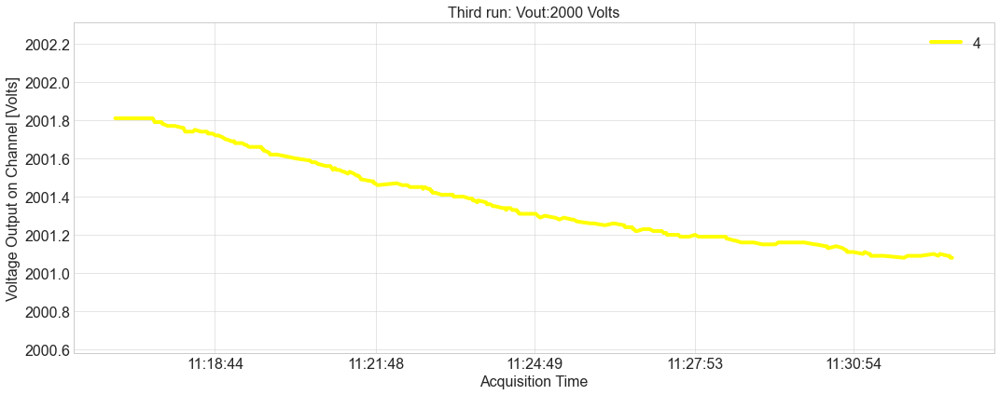

...

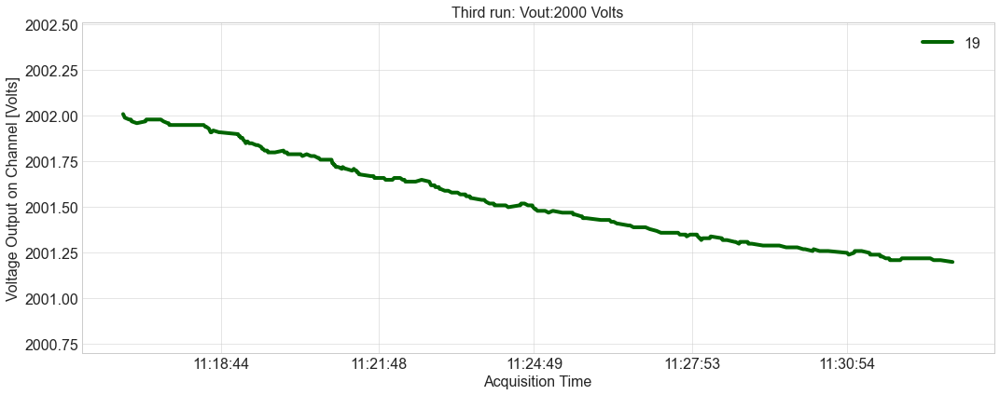

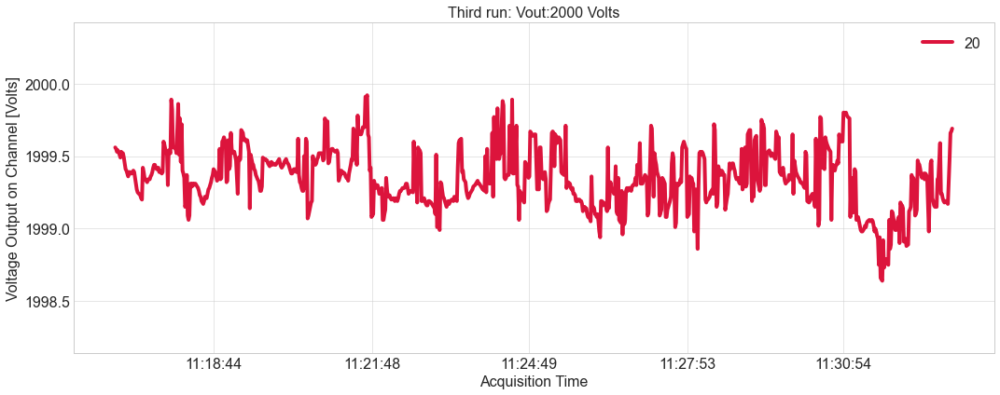

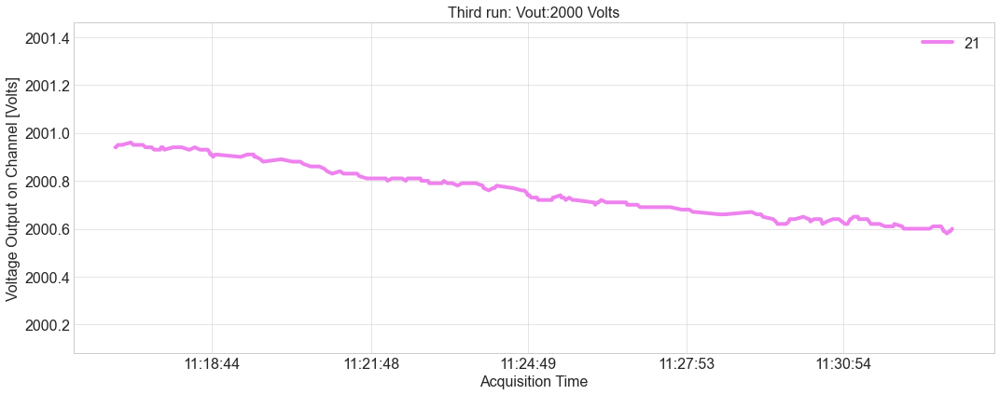

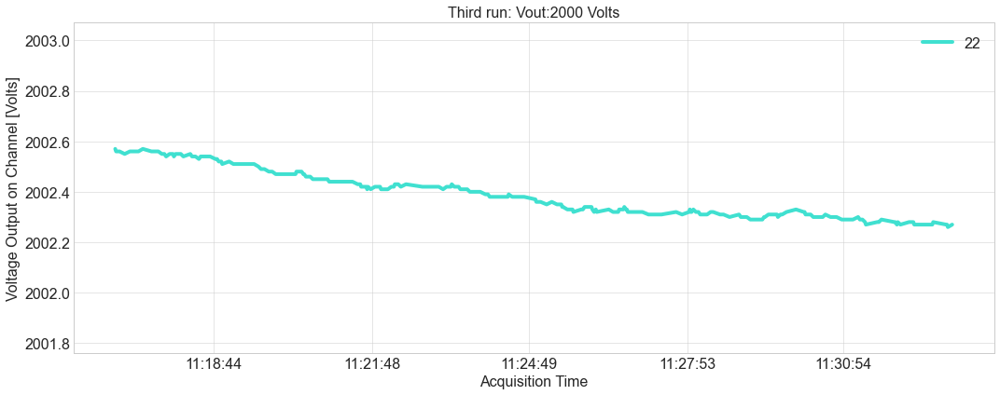

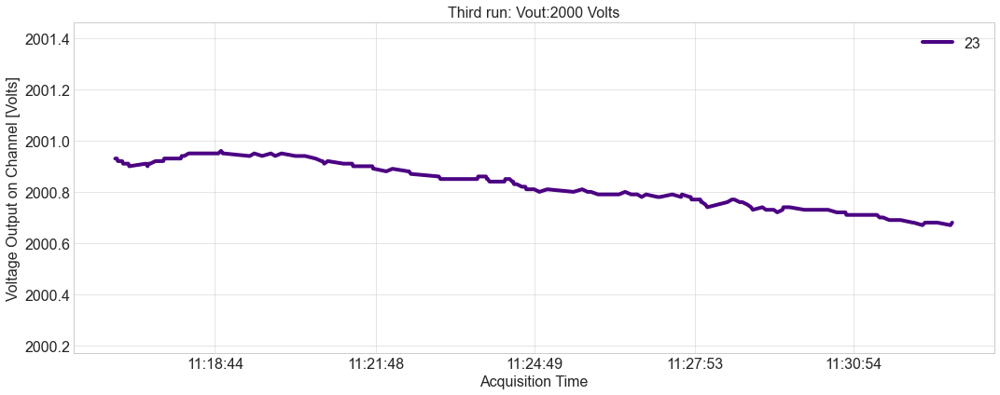

In [768]:
for ch, group in voltage_3rd_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.5
    ymax=group['Value'].max()+0.5
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Voltage Output on Channel [Volts]')
    plt.ylim(ymin,ymax)
    plt.title('Third run: Vout:2000 Volts')
    plt.tight_layout()
    plt.show()    

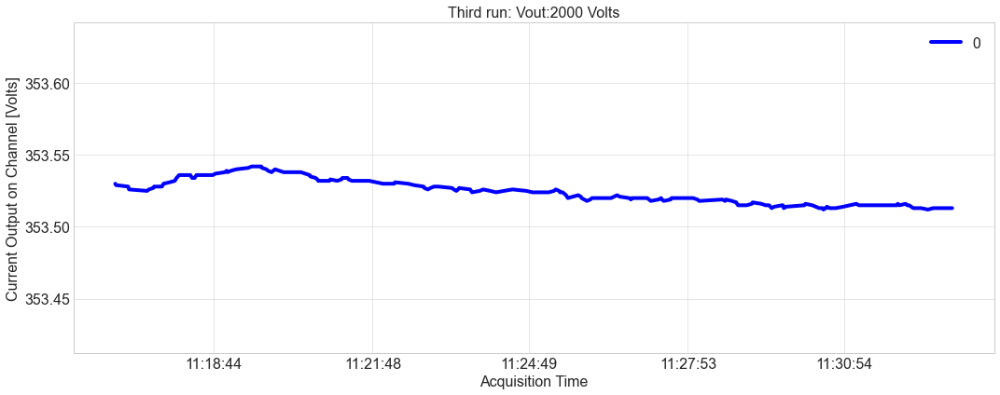

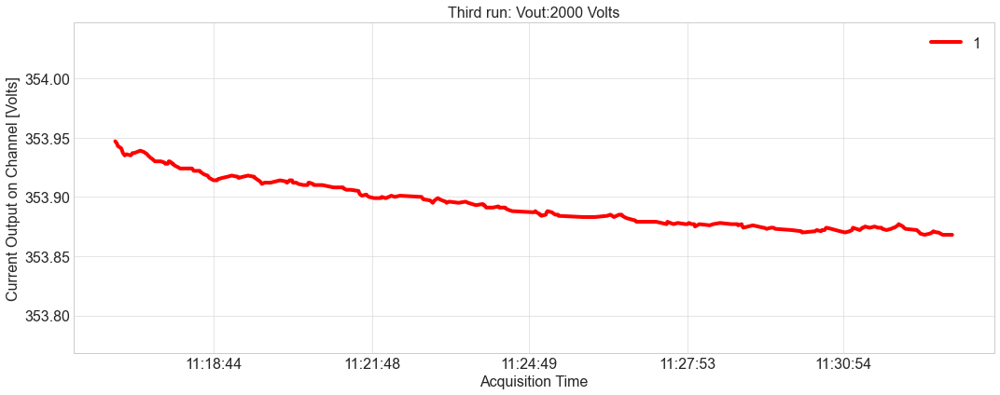

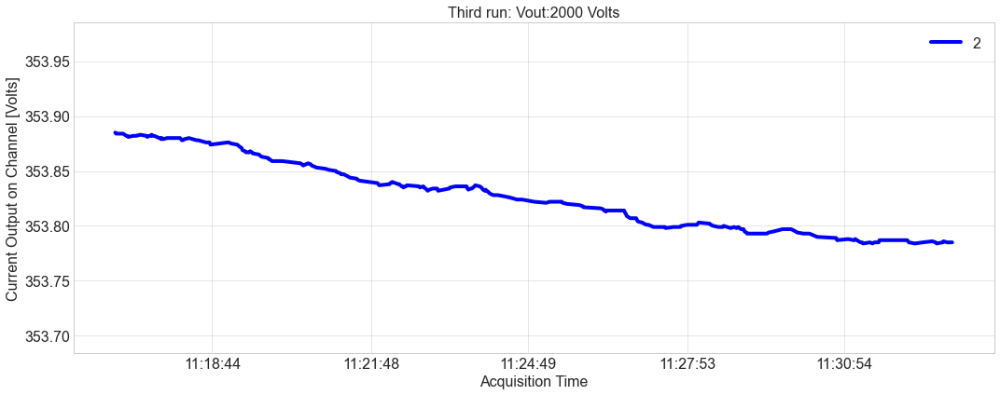

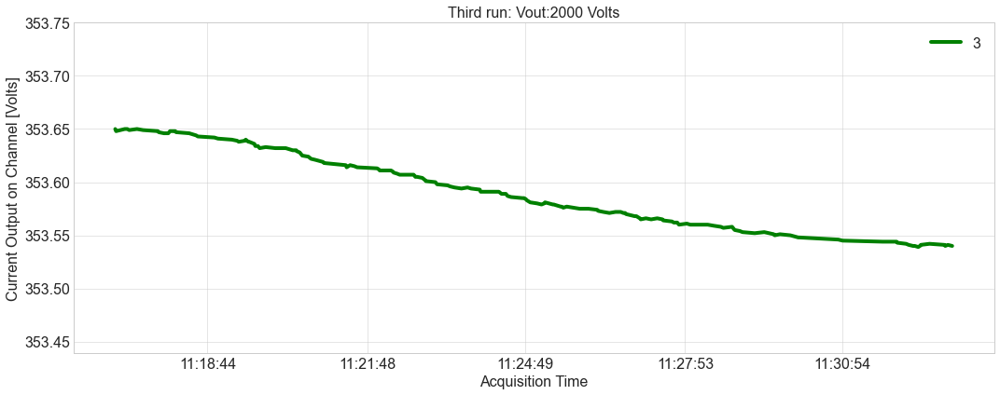

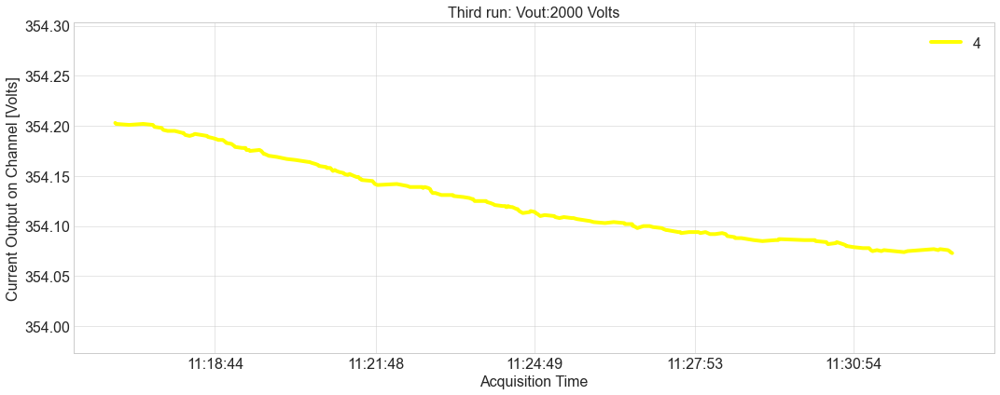

...

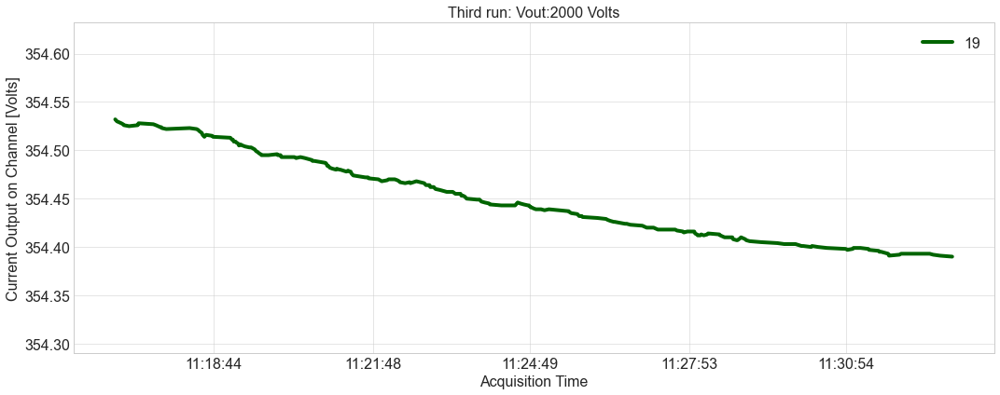

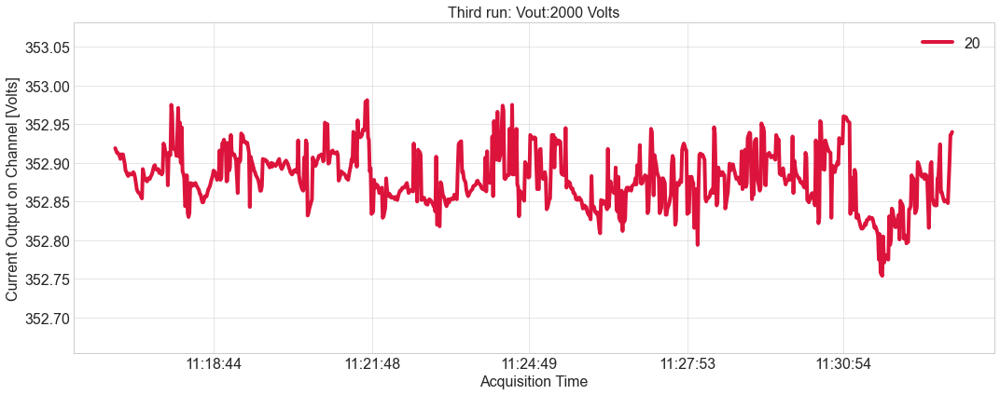

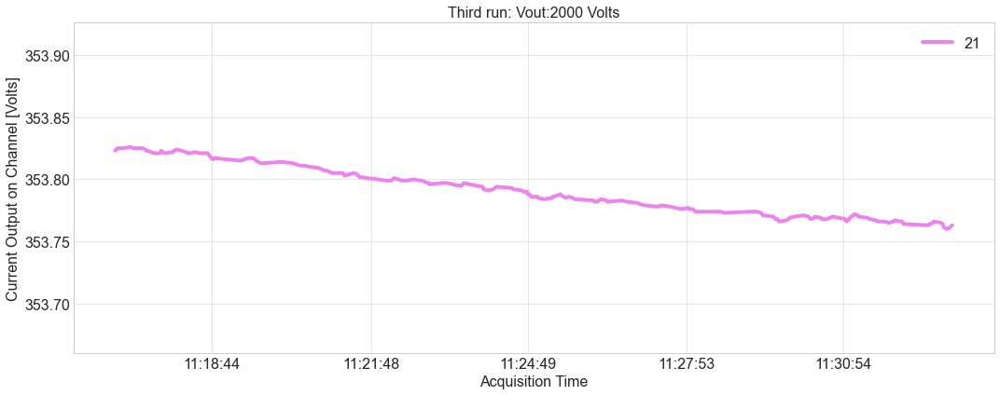

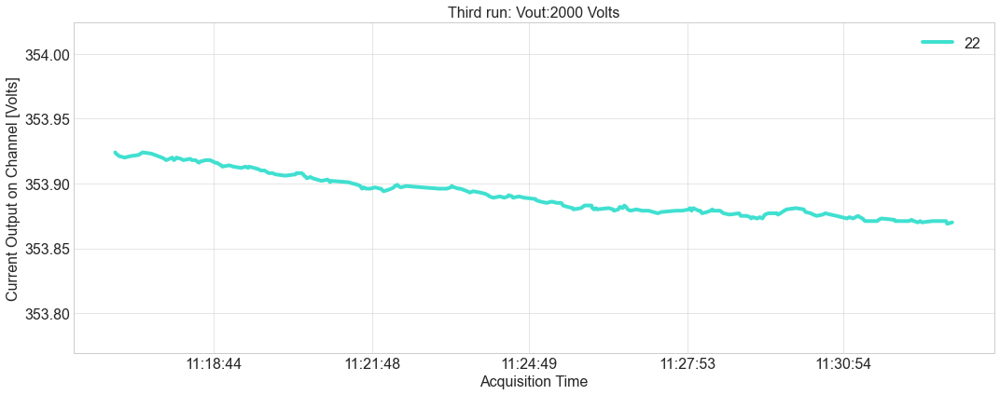

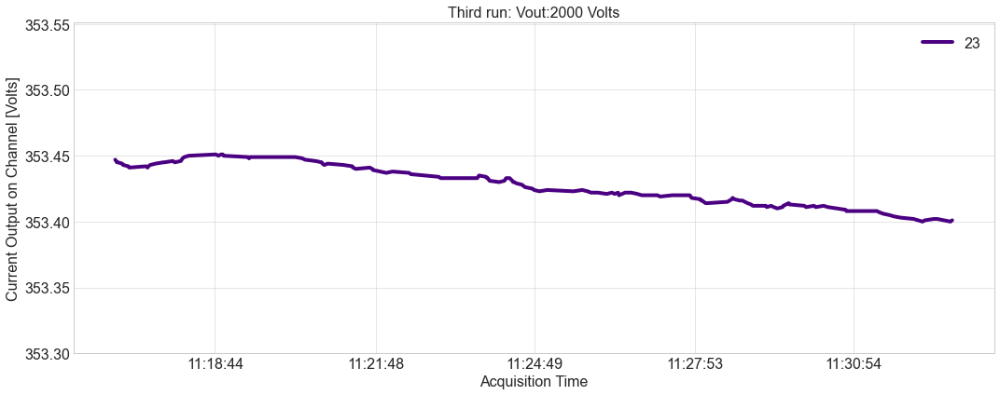

In [769]:
for ch, group in current_3rd_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.1
    ymax=group['Value'].max()+0.1
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Current Output on Channel [Volts]')
    plt.ylim(ymin,ymax)
    plt.title('Third run: Vout:2000 Volts')
    plt.tight_layout()
    plt.show()    

#######################################################################################
#######################################################################################
#######################################################################################
##  CHANNEL BY CHANNEL VOLTAGE AND CURRENT OUTPUT
##  FOURTH RUN
#######################################################################################
#######################################################################################
#######################################################################################

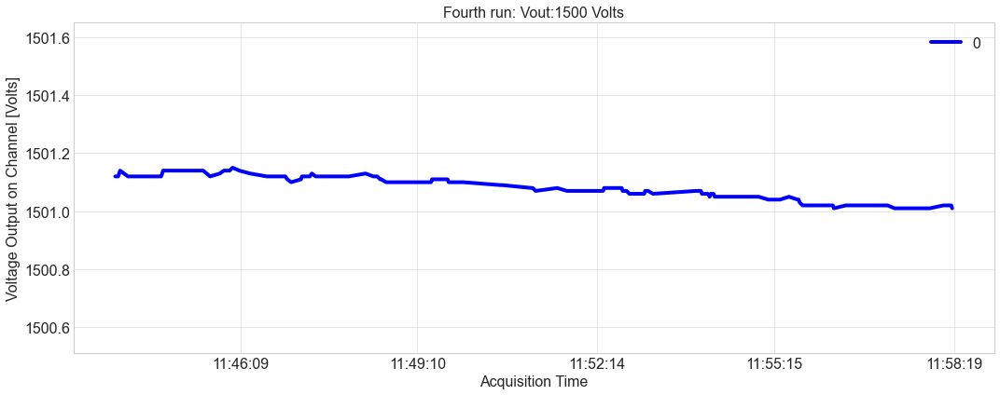

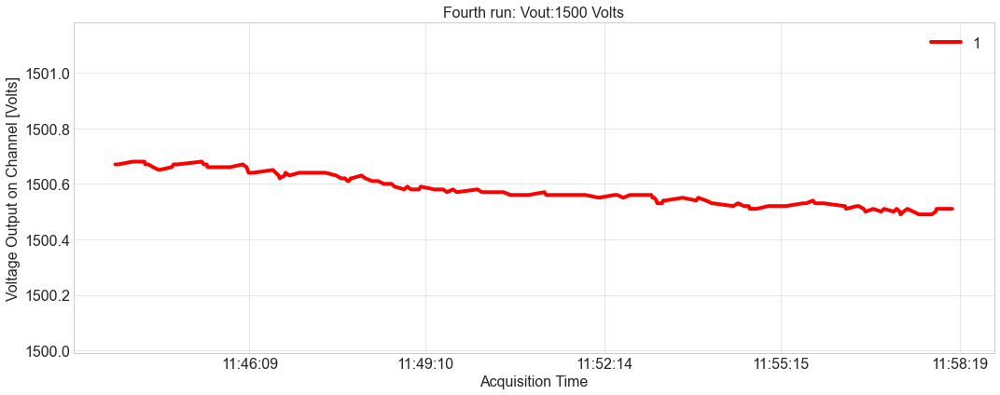

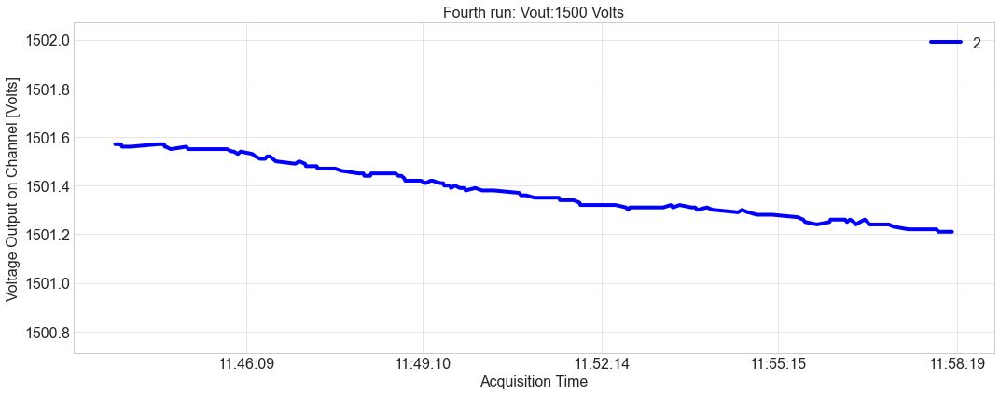

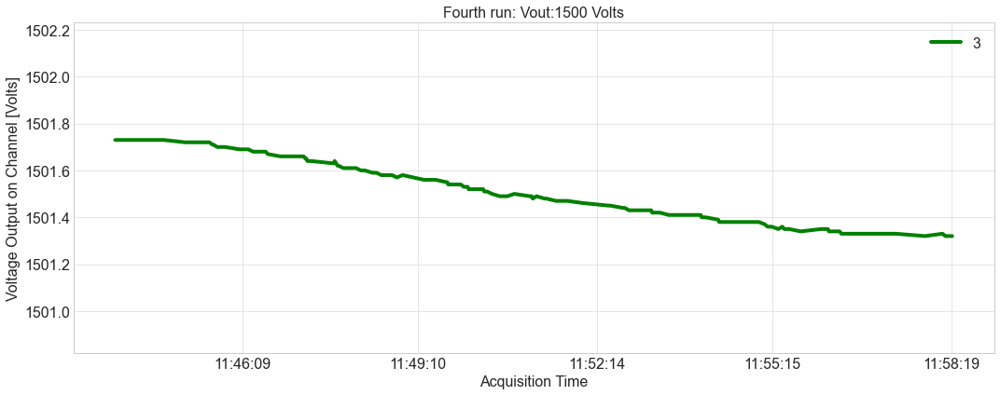

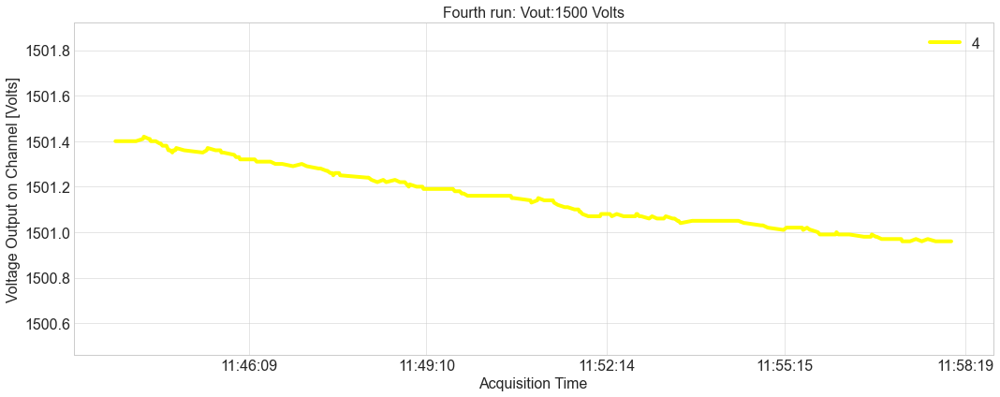

...

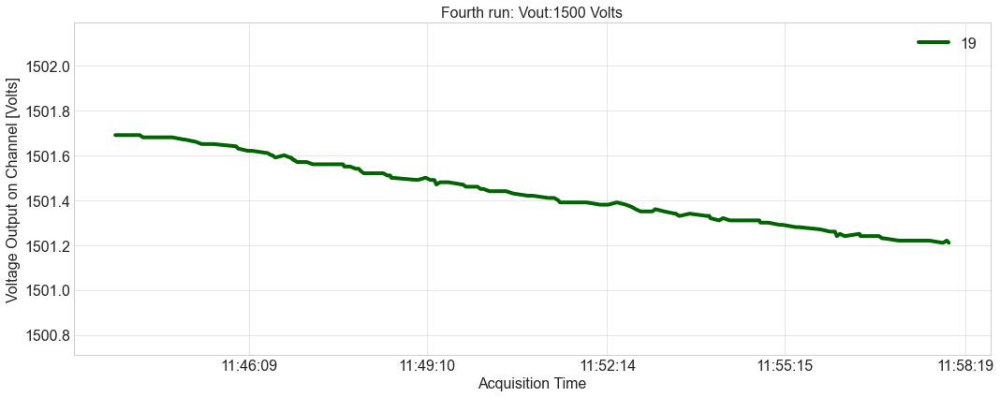

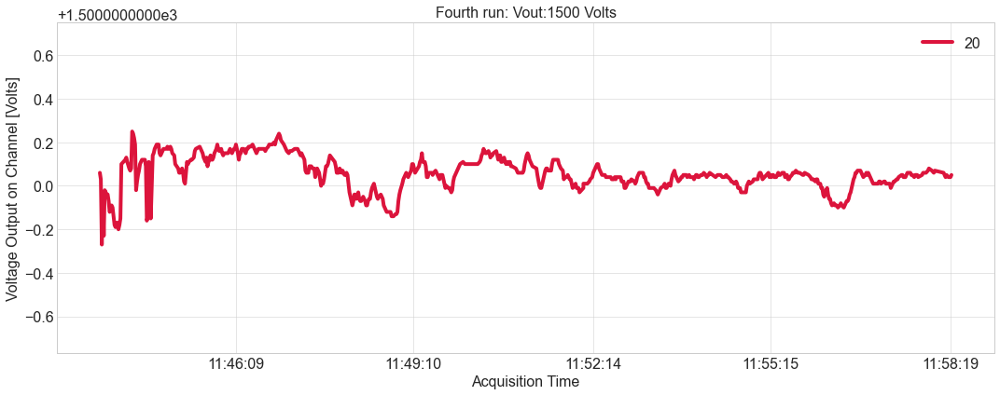

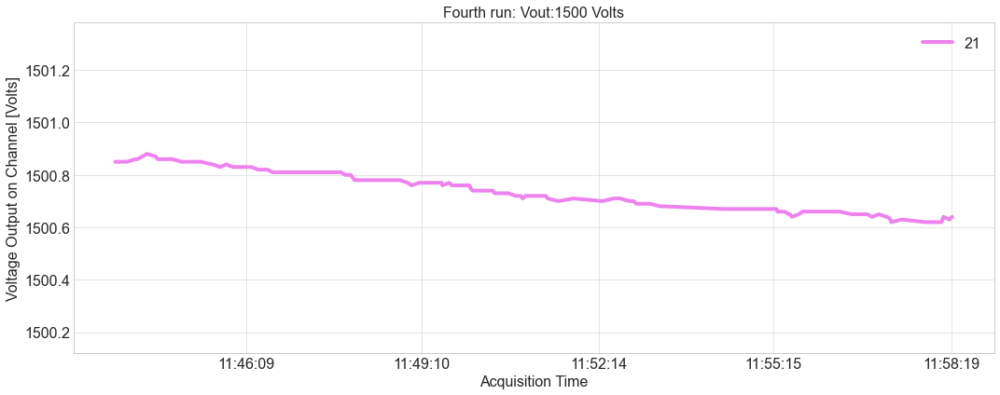

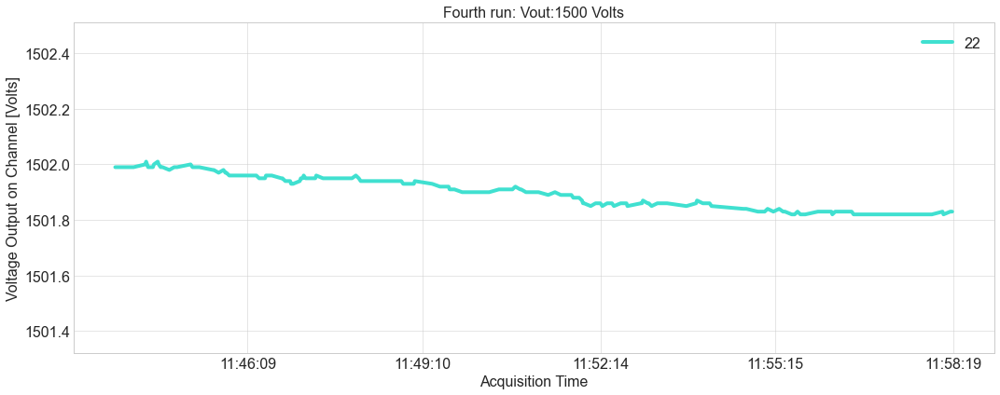

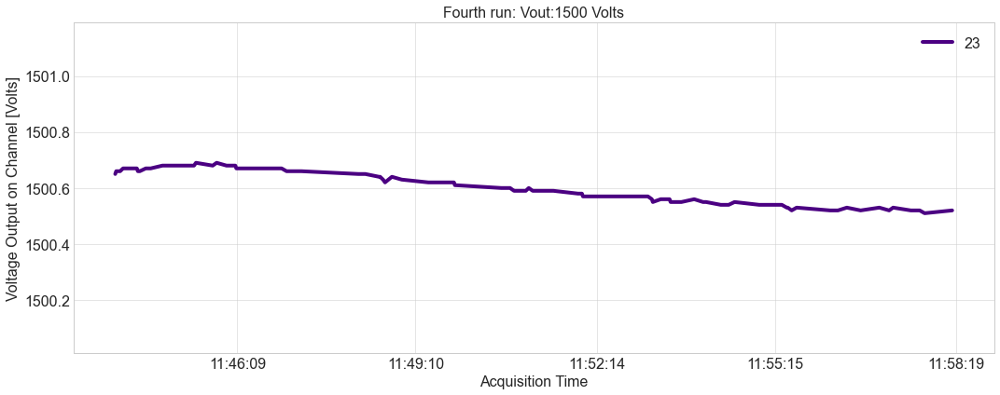

In [770]:
for ch, group in voltage_4th_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.5
    ymax=group['Value'].max()+0.5
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Voltage Output on Channel [Volts]')
    plt.ylim(ymin,ymax)
    plt.title('Fourth run: Vout:1500 Volts')
    plt.tight_layout()
    plt.show()    

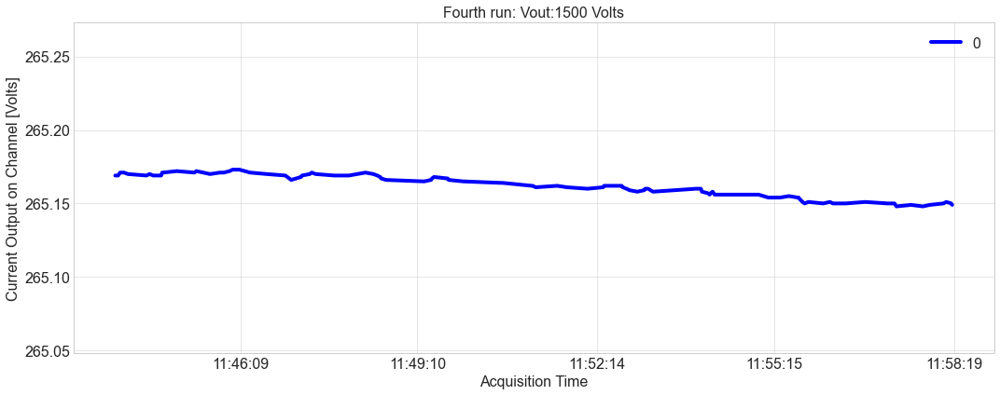

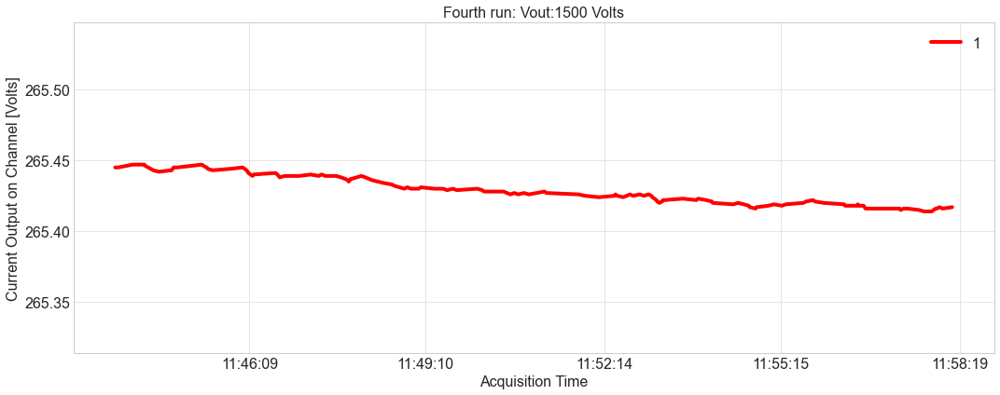

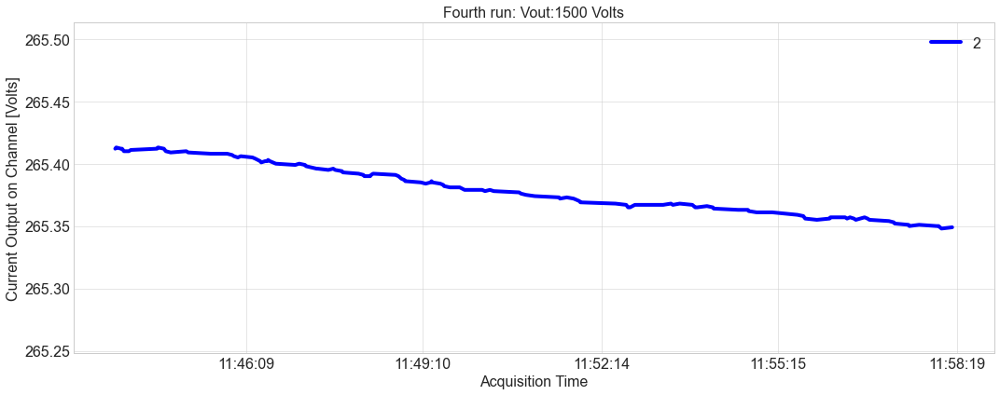

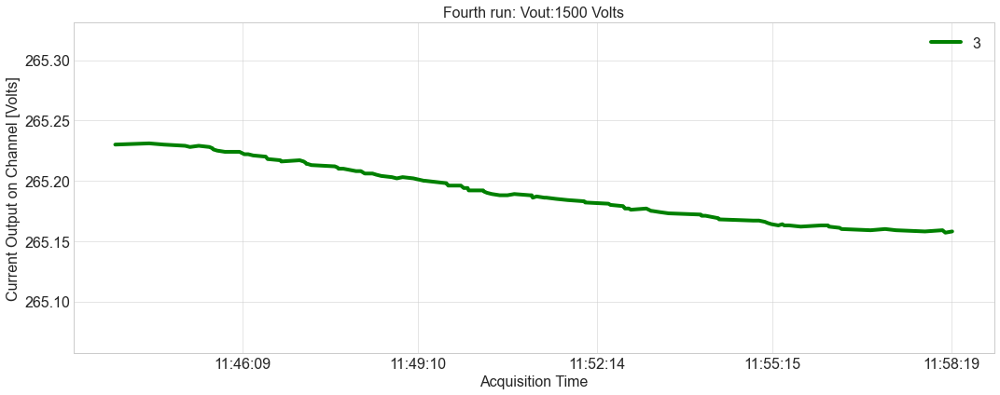

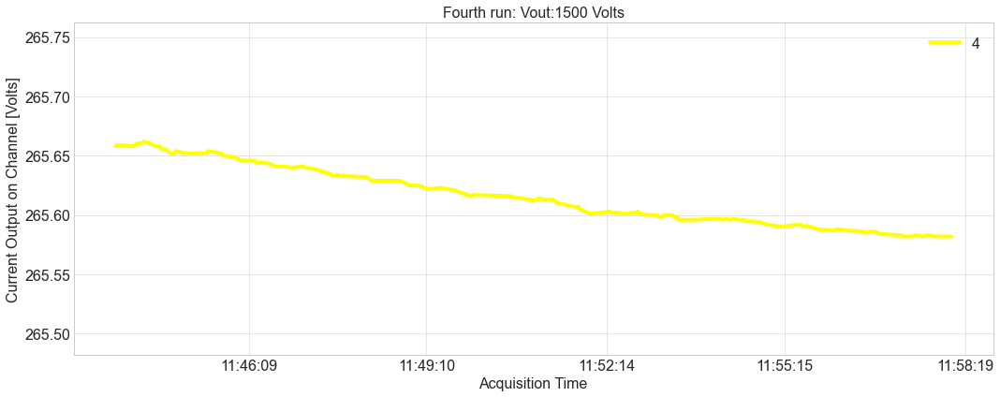

...

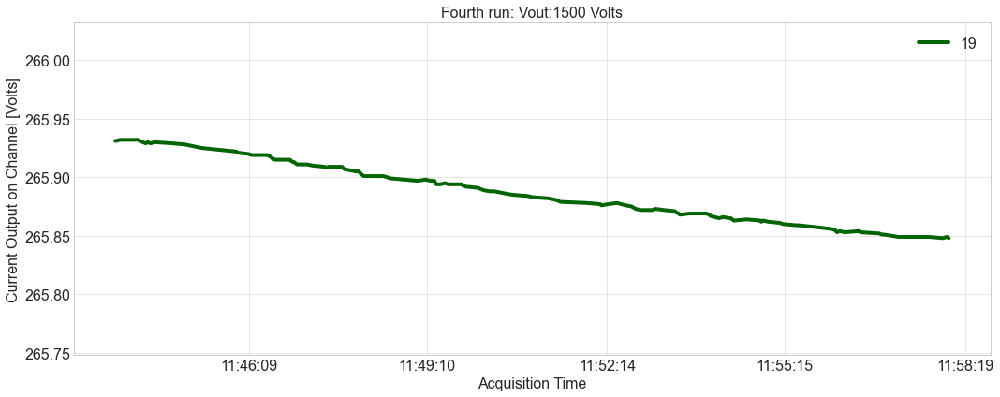

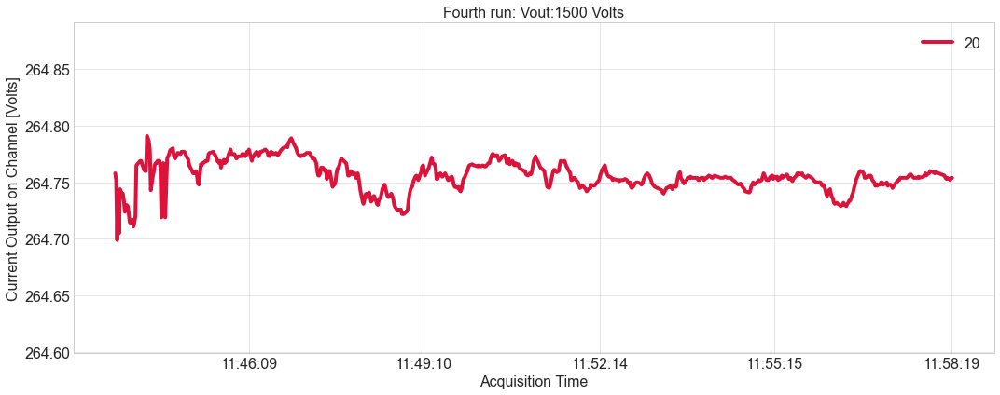

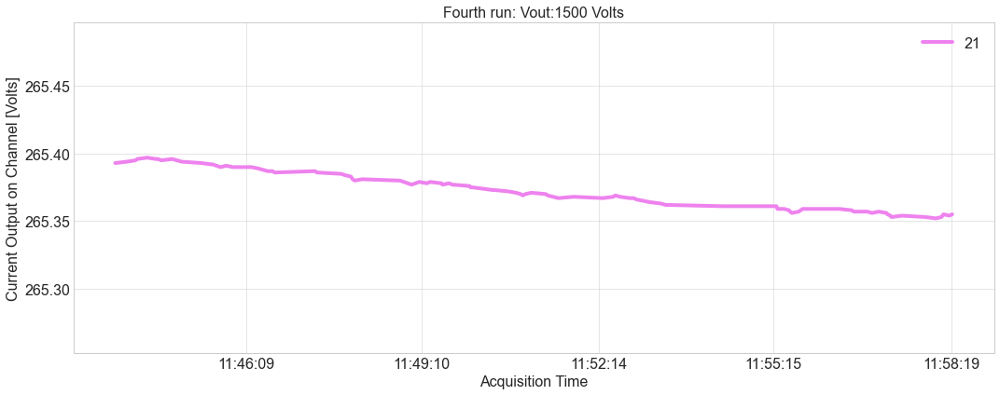

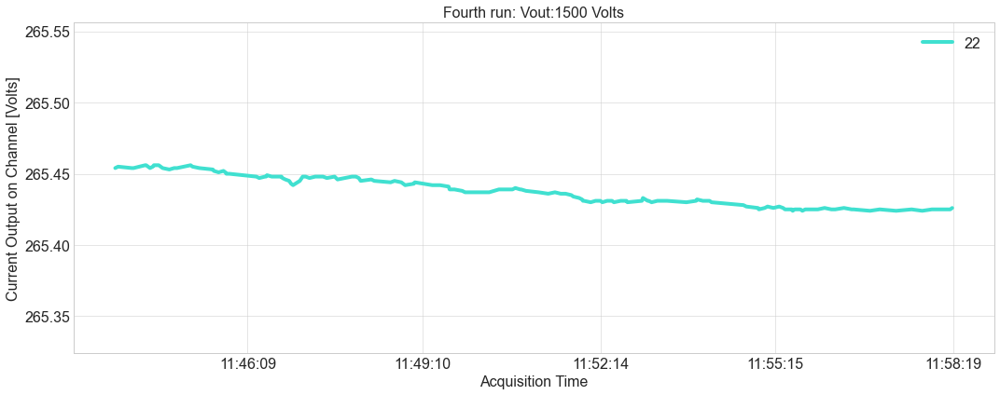

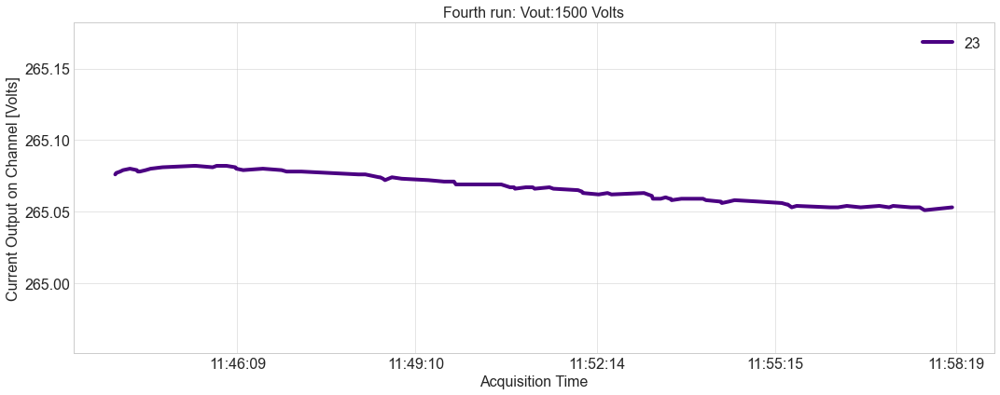

In [771]:
for ch, group in current_4th_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.1
    ymax=group['Value'].max()+0.1
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Current Output on Channel [Volts]')
    plt.ylim(ymin,ymax)
    plt.title('Fourth run: Vout:1500 Volts')
    plt.tight_layout()
    plt.show()    

#######################################################################################
#######################################################################################
#######################################################################################
##  CHANNEL BY CHANNEL VOLTAGE AND CURRENT OUTPUT
##  FIFTH RUN
#######################################################################################
#######################################################################################
#######################################################################################

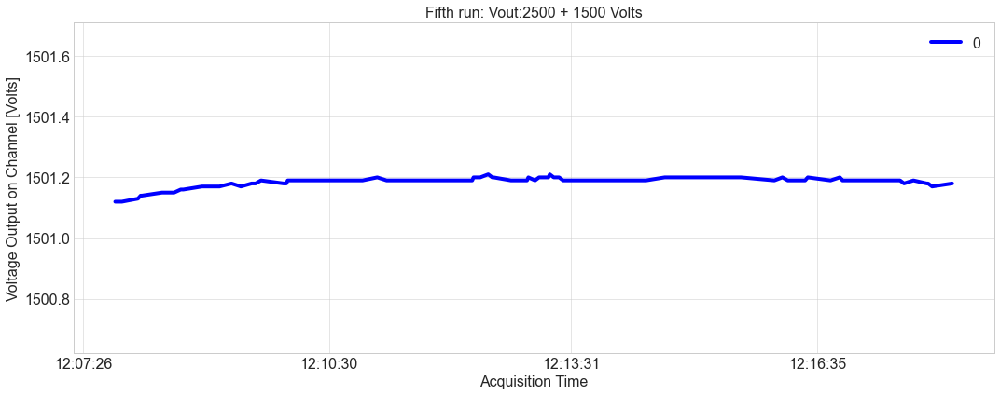

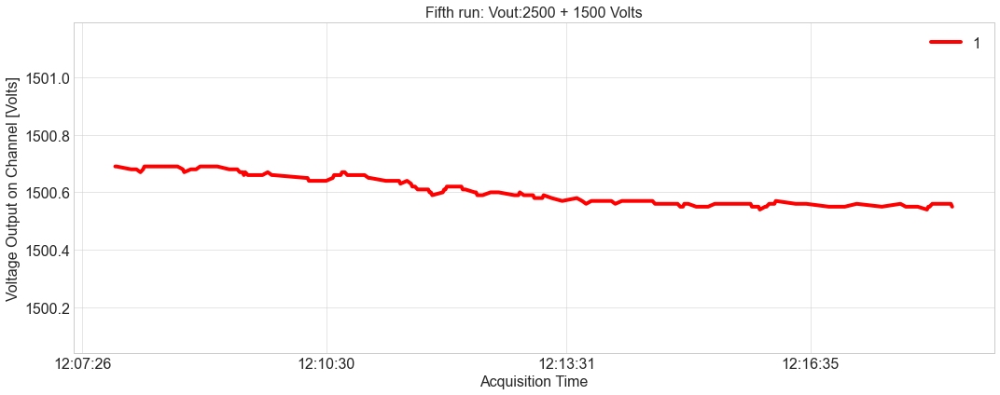

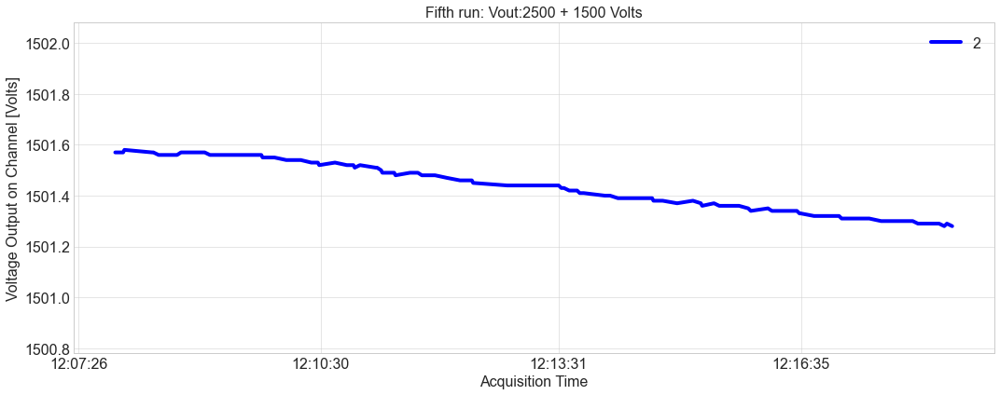

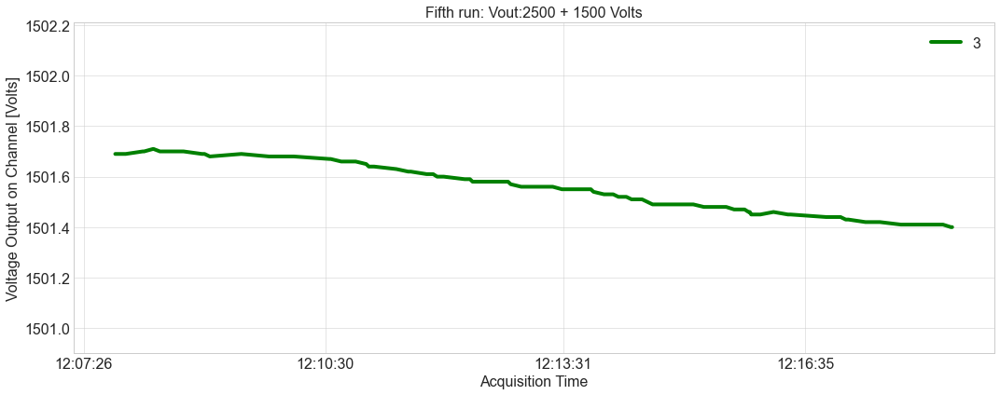

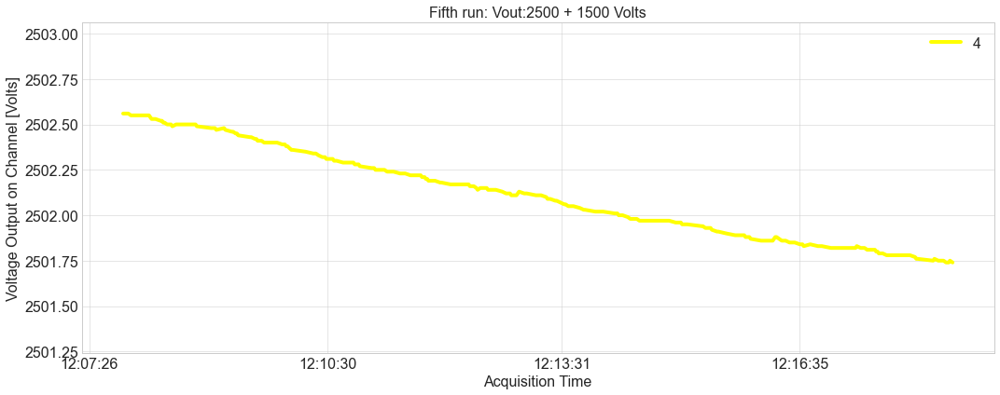

...

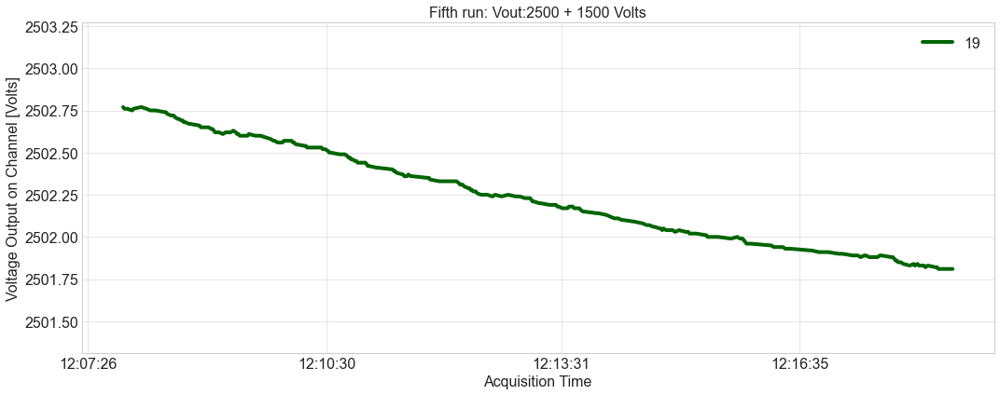

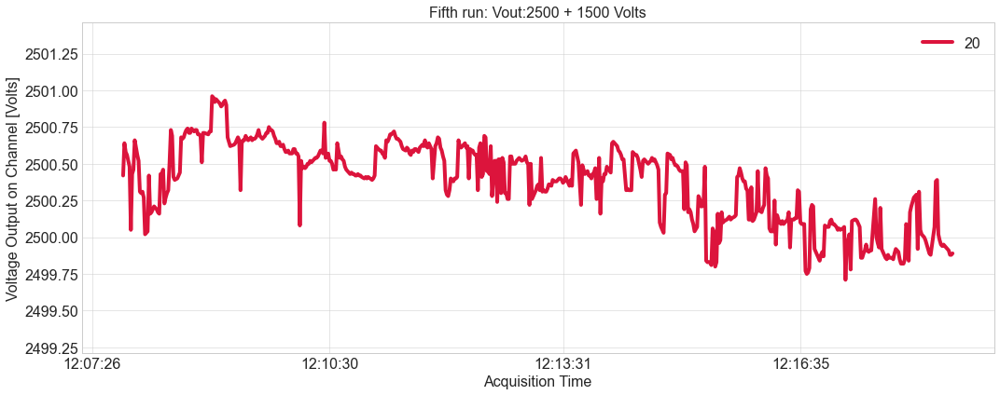

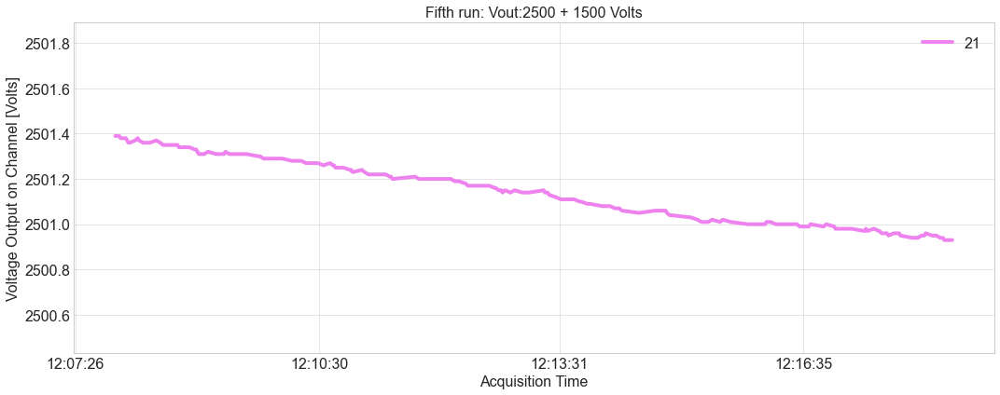

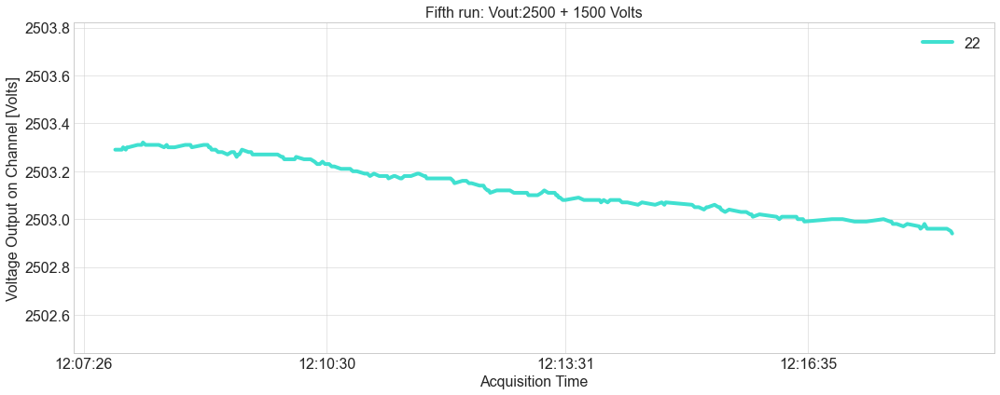

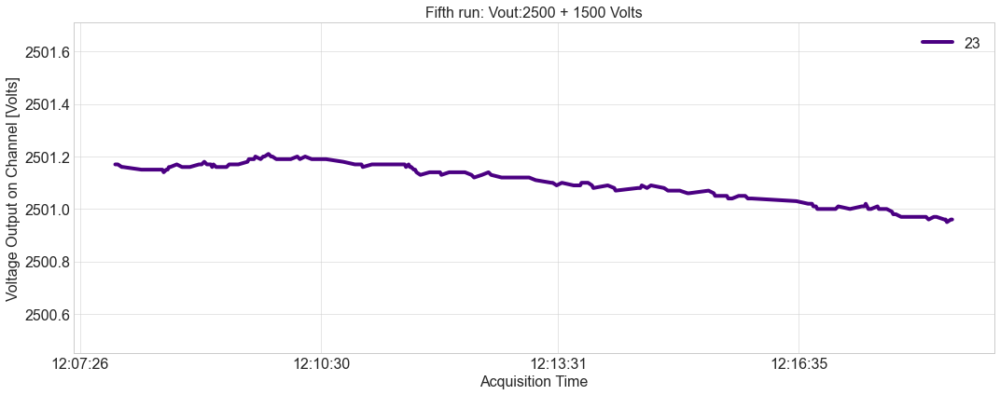

In [772]:
for ch, group in voltage_5th_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.5
    ymax=group['Value'].max()+0.5
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Voltage Output on Channel [Volts]')
    plt.ylim(ymin,ymax)
    plt.title('Fifth run: Vout:2500 + 1500 Volts')
    plt.tight_layout()
    plt.show()    

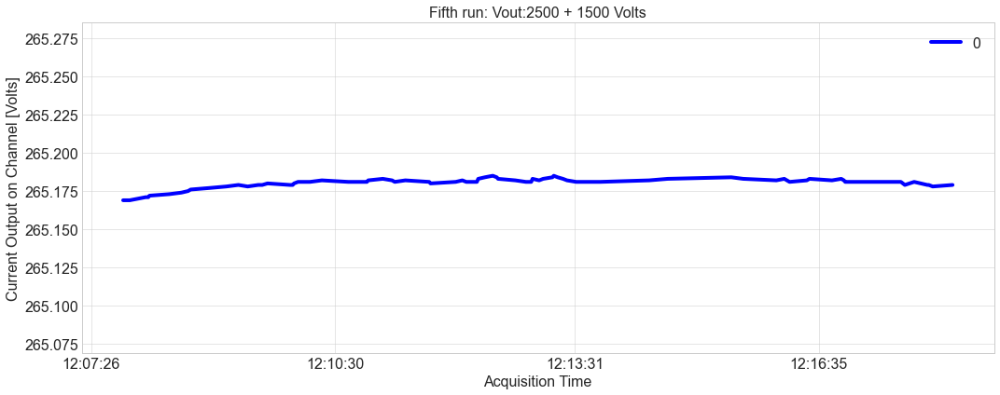

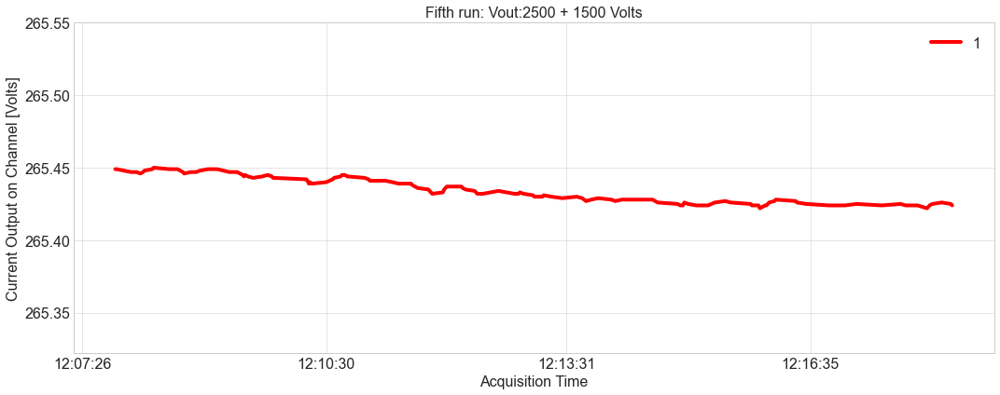

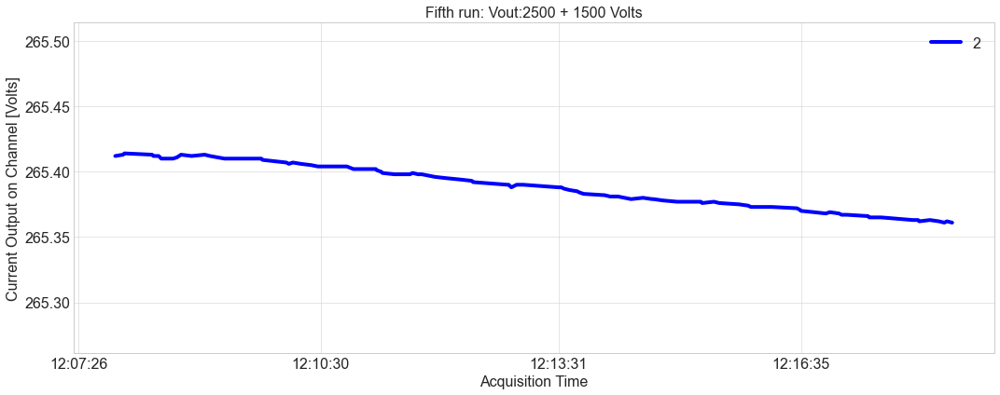

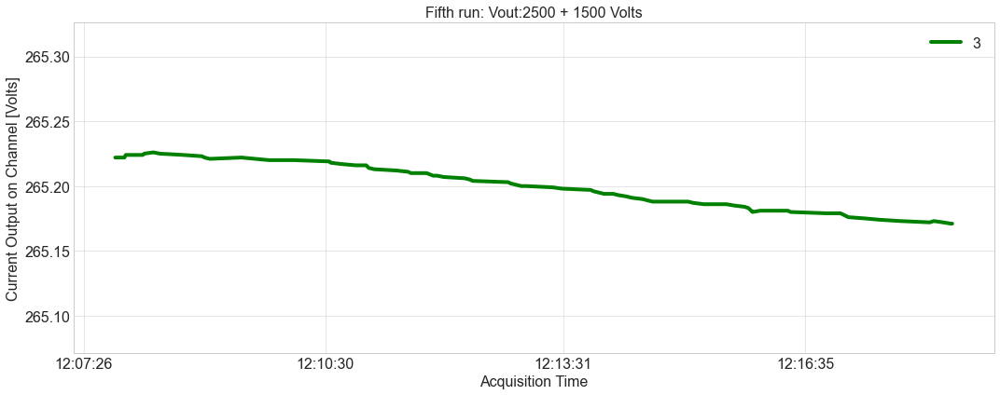

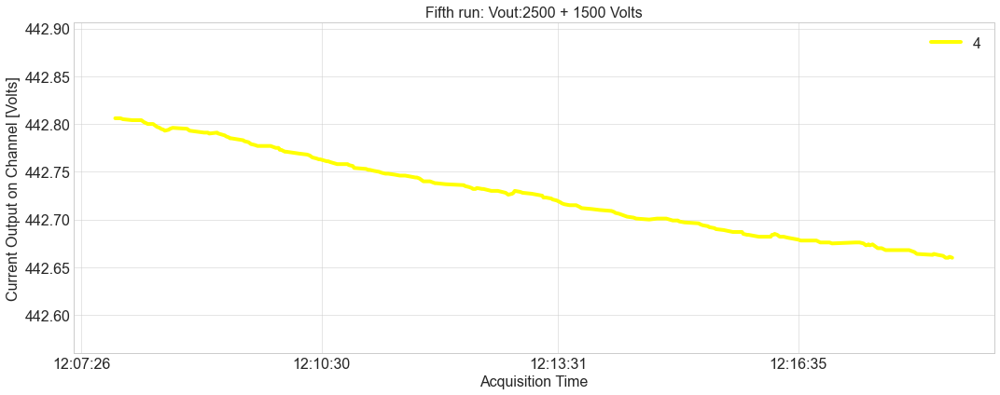

...

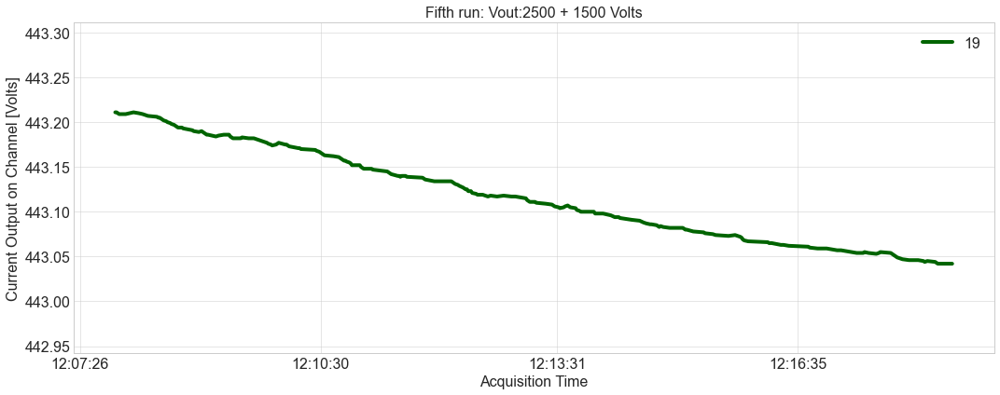

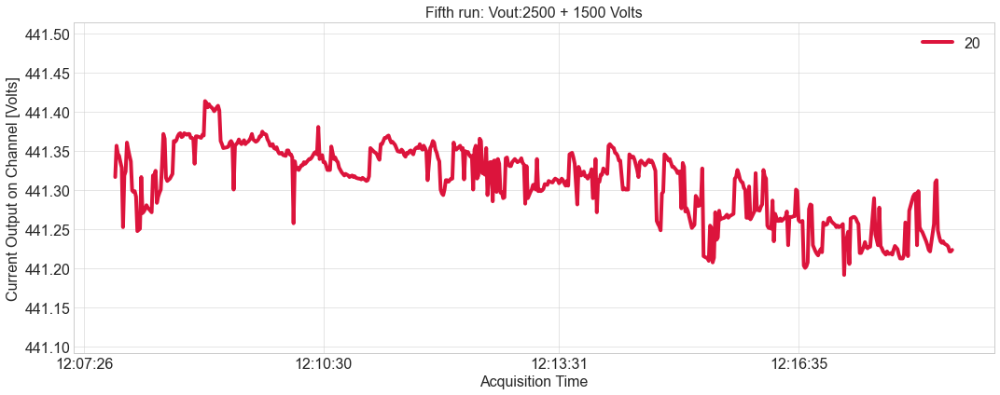

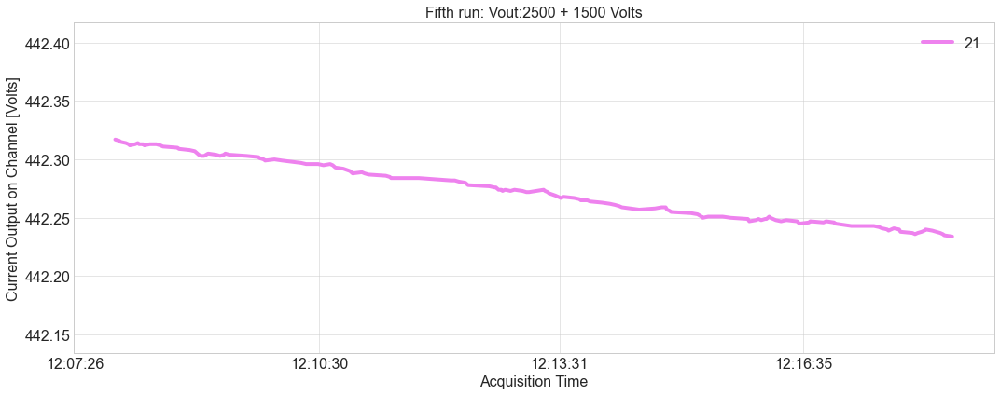

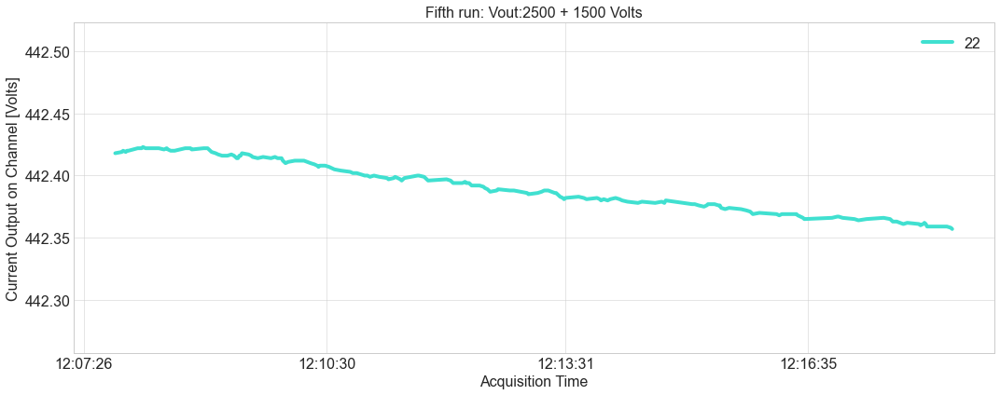

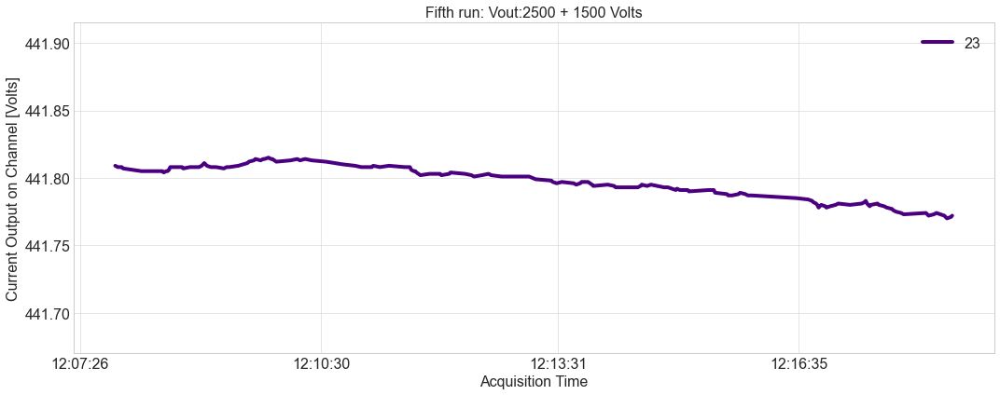

In [773]:
for ch, group in current_5th_run.groupby("Channel"):
    ax = group.plot(x="Time",y="Value",figsize=(15,6),label=ch, linewidth=4, color=group["Channel"].map(color))
    ymin=group['Value'].min()-0.1
    ymax=group['Value'].max()+0.1
    ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1,7)))
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    ax.set(xlabel='Acquisition Time', ylabel='Current Output on Channel [Volts]')
    plt.ylim(ymin,ymax)
    plt.title('Fifth run: Vout:2500 + 1500 Volts')
    plt.tight_layout()
    plt.show()    